### Bayesian workflow for term structure modelling

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pymc as pm
import arviz as az
import seaborn as sns
from scipy import stats
import quandl
from matplotlib import cm
from mpl_toolkits import mplot3d
import statsmodels.api as sm
%matplotlib inline

Primeira parte: prior predictive checks

Principal referência: Gelman et al. (2020) Bayesian Workflow

Outra referência com foco em visualização: Gabry et al. (2019)

Forma visual de escolher distribuições a priori: gerar dados a partir do modelo com os parâmetros tendo valores iguais às distribuições a priori, e verificar se esses dados gerados são factíveis dado o contexto teórico do modelo

Contexto da curva de juros brasileira da última década: valores muito altos para taxas spot (ex. taxas de 50%) são pouco factíveis, assim como valores negativos

Prioris mais informativas = "regularização"

Etapas BWf:

1. Escolher modelos (Vasicek, CIR e Diebold-Li)
2. Prior predictive check (prioris consistentes com conhecimento de domínio, que "impeçam absurdos")
3. Ajuste com dados simulados (conhecemos verdadeiros parâmetros)
4. Diagnósticos de convergência
5. Ajuste com dados reais
6. Posterior predictive check (amostras da posteriori preditiva se parecem com dados reais?)
7. Medidas de previsão tradicionais vs "novas" (EQM, validação cruzada...)
8. Extrapolação para outros contextos? (curvas de outros países)


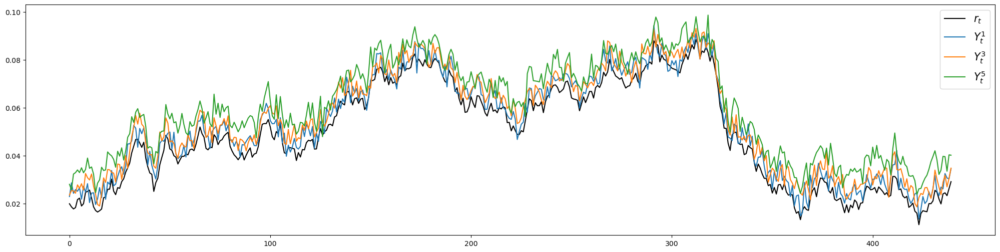

In [2]:
dt = 1/52 #weekly data

np.random.seed(123)
kappa_sim = 0.4
mu_sim = 0.05
sigma_sim = 0.02
a_sim = 0.2
b_sim = 0.3
sigma_obs = 0.003
r0_sim = 0.08

T = 440

r_sim = np.zeros(2*T)
r_sim[0] = r0_sim + kappa_sim*(mu_sim - r0_sim)*dt + (sigma_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    r_sim[i + 1] = r_sim[i] + kappa_sim*(mu_sim - r_sim[i])*dt + (sigma_sim * np.sqrt(dt) * np.random.randn())
r0_sim=r_sim[T-1]
r_sim = r_sim[T:]
r_sim = r_sim.reshape((T,1))

def B(beta,tau):
    return (1 - np.exp(-beta * tau))/beta

def A(beta,alpha,sigma,tau):
    return ((sigma**2/(2*beta**2)) - alpha)*tau + (B(beta,tau)*(alpha - (sigma/beta)**2)) + ((sigma/(2*beta))**2)*(1-np.exp(-2*beta*tau))/beta

TTM = np.array([1/6,1/4,1/2,1,3,5])
y_mean_sim = lambda tau: -(A(b_sim,a_sim,sigma_sim,tau) - B(b_sim,tau)*r_sim)/tau

Y_sim = y_mean_sim(TTM) + (sigma_obs * np.random.randn(T,len(TTM)))

plt.figure(figsize=(25,6))
plt.plot(r_sim, label=r'$r_t$', color="black")
plt.plot(Y_sim[:,0], label=r'$Y^1_t$')
plt.plot(Y_sim[:,1], label=r'$Y^3_t$')
plt.plot(Y_sim[:,2], label=r'$Y^5_t$')
plt.legend(prop={'size': 15})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(


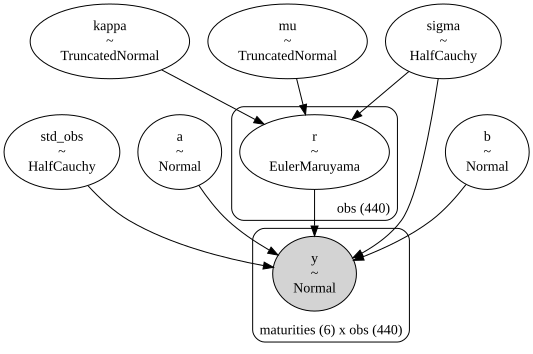

In [3]:
def vasicek_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma

def B(beta,tau):
    return (1 - pm.math.exp(-beta * tau))/beta

def A(beta,alpha,sigma,tau):
    return ((sigma**2/(2*pm.math.sqr(beta))) - alpha)*tau + (B(beta,tau)*(alpha - pm.math.sqr(sigma/beta))) + pm.math.sqr(sigma/(2*beta))*(1-pm.math.exp(-2*beta*tau))/beta

dt = 1/52

T = len(r_sim)
coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

with pm.Model(coords=coords) as vasicek_sim_model:

    kappa = pm.TruncatedNormal('kappa', mu = 0.7, sigma = 0.4, lower=0, upper=2/dt)
    mu = pm.TruncatedNormal('mu', mu = 0.08, sigma=0.1, lower=0)
    sigma = pm.HalfCauchy('sigma', beta = 0.03)
    a = pm.Normal('a', mu = 0.1, sigma = 0.1)
    b = pm.Normal('b', mu = 0.5, sigma = 0.5)
    
    r = pm.distributions.timeseries.EulerMaruyama("r", dt, vasicek_coeffs, (kappa, mu, sigma,), shape=T, dims="obs", initval=np.repeat(0.04,T))

    y_mean = lambda tau: -(A(b,a,sigma,tau) - (B(b,tau)*r))/tau
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.008)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, shape=(len(TTM),T), dims=('maturities','obs'), observed=Y_sim.T)
    
pm.model_to_graphviz(vasicek_sim_model)

In [4]:
prior_samples = 20

with vasicek_sim_model:
    vasicek_sim_prior = pm.sample_prior_predictive(var_names=['a','b','kappa','mu','sigma'], samples = prior_samples).to_dataframe()

Sampling: [a, b, kappa, mu, sigma]


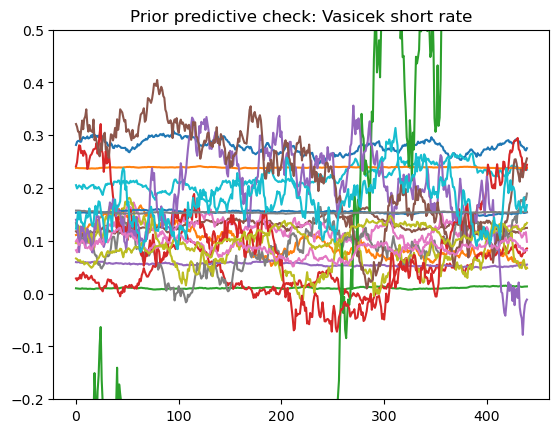

In [5]:
r0_prior = 0.04
dt = 1/52
T = 440

r_prior_sim = np.zeros([2*T,prior_samples])
for j in range(0,prior_samples):
    r_prior_sim[0,j] = r0_prior + vasicek_sim_prior["kappa"][j]*(vasicek_sim_prior["mu"][j] - r0_prior)*dt + (vasicek_sim_prior["sigma"][j] * np.sqrt(dt) * np.random.randn())
    for i in range(0, 2*T - 1):
        r_prior_sim[i+1,j] = r_prior_sim[i,j] + vasicek_sim_prior["kappa"][j]*(vasicek_sim_prior["mu"][j] - r_prior_sim[i,j])*dt + (vasicek_sim_prior["sigma"][j] * np.sqrt(dt) * np.random.randn())
r_prior_sim = r_prior_sim[T:]

plt.ylim(-0.2,0.5)
plt.plot(r_prior_sim)
plt.title("Prior predictive check: Vasicek short rate")
plt.show()

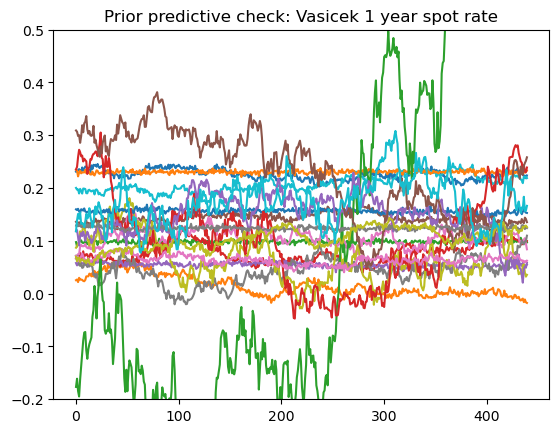

In [6]:
tau = 1

def B_num(beta,tau):
    return (1 - np.exp(-beta * tau))/beta

def A_num(beta,alpha,sig,tau):
    return ((sig**2/(2*beta**2)) - alpha)*tau + (B_num(beta,tau)*(alpha - (sig/beta)**2)) + ((sig/(2*beta))**2)*(1-np.exp(-2*beta*tau))/beta

Y_prior_sim = -(A_num(vasicek_sim_prior["b"].to_numpy(),vasicek_sim_prior["a"].to_numpy(),vasicek_sim_prior["sigma"].to_numpy(),tau) - B_num(vasicek_sim_prior["b"].to_numpy(),tau)*r_prior_sim)/tau + (np.random.normal(scale=sigma_obs,size=(T,prior_samples)))

plt.ylim(-0.2,0.5)
plt.plot(Y_prior_sim)
plt.title("Prior predictive check: Vasicek 1 year spot rate")
plt.show()

In [7]:
chains = 2
draws = 2000

with vasicek_sim_model:
    vasicek_sim_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.9, chains=chains, return_inferencedata=True, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [kappa, mu, sigma, a, b, r, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 86 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [8]:
with vasicek_sim_model:

    vasicek_sim_ppc = pm.sample_posterior_predictive(trace=vasicek_sim_trace)
    vasicek_sim_data = vasicek_sim_trace

Sampling: [y]


In [113]:
az.summary(vasicek_sim_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
a,0.204,0.002,0.199,0.208,0.000,0.000,1486.0,2443.0,1.0,0.204
b,0.287,0.005,0.275,0.299,0.000,0.000,1325.0,2263.0,1.0,0.287
kappa,0.483,0.256,0.001,1.114,0.006,0.004,1560.0,1152.0,1.0,0.473
mu,0.057,0.028,0.004,0.169,0.001,0.001,1627.0,1174.0,1.0,0.053
sigma,0.020,0.001,0.018,0.022,0.000,0.000,2328.0,2727.0,1.0,0.020
std_obs,0.003,0.000,0.003,0.003,0.000,0.000,3904.0,3099.0,1.0,0.003


In [114]:
az.summary(vasicek_sim_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(
C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\1125795681.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(vasicek_sim_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &   mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\na       &  0.204 &  0.002 &     0.199 &      0.208 &      0.000 &    0.000 &    1486.0 &    2443.0 &    1.0 &   0.204 \\\\\nb       &  0.287 &  0.005 &     0.275 &      0.299 &      0.000 &    0.000 &    1325.0 &    2263.0 &    1.0 &   0.287 \\\\\nkappa   &  0.483 &  0.256 &     0.001 &      1.114 &      0.006 &    0.004 &    1560.0 &    1152.0 &    1.0 &   0.473 \\\\\nmu      &  0.057 &  0.028 &     0.004 &      0.169 &      0.001 &    0.001 &    1627.0 &    1174.0 &    1.0 &   0.053 \\\\\nsigma   &  0.020 &  0.001 &     0.018 &      0.022 &      0.000 &    0.000 &    2328.0 &    2727.0 &    1.0 &   0.020 \\\\\nstd\\_obs &  0.003 &  0.000 &     0.003 &      0.003 &      0.000 &    0.000 &    3904.0 &    3099.0 &    1.0 &   0.003 \\\\\n\\bottomrule\n\\end{tabular}\n'

array([[<Axes: title={'center': 'a'}>, <Axes: title={'center': 'a'}>],
       [<Axes: title={'center': 'b'}>, <Axes: title={'center': 'b'}>],
       [<Axes: title={'center': 'kappa'}>,
        <Axes: title={'center': 'kappa'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'std_obs'}>,
        <Axes: title={'center': 'std_obs'}>]], dtype=object)

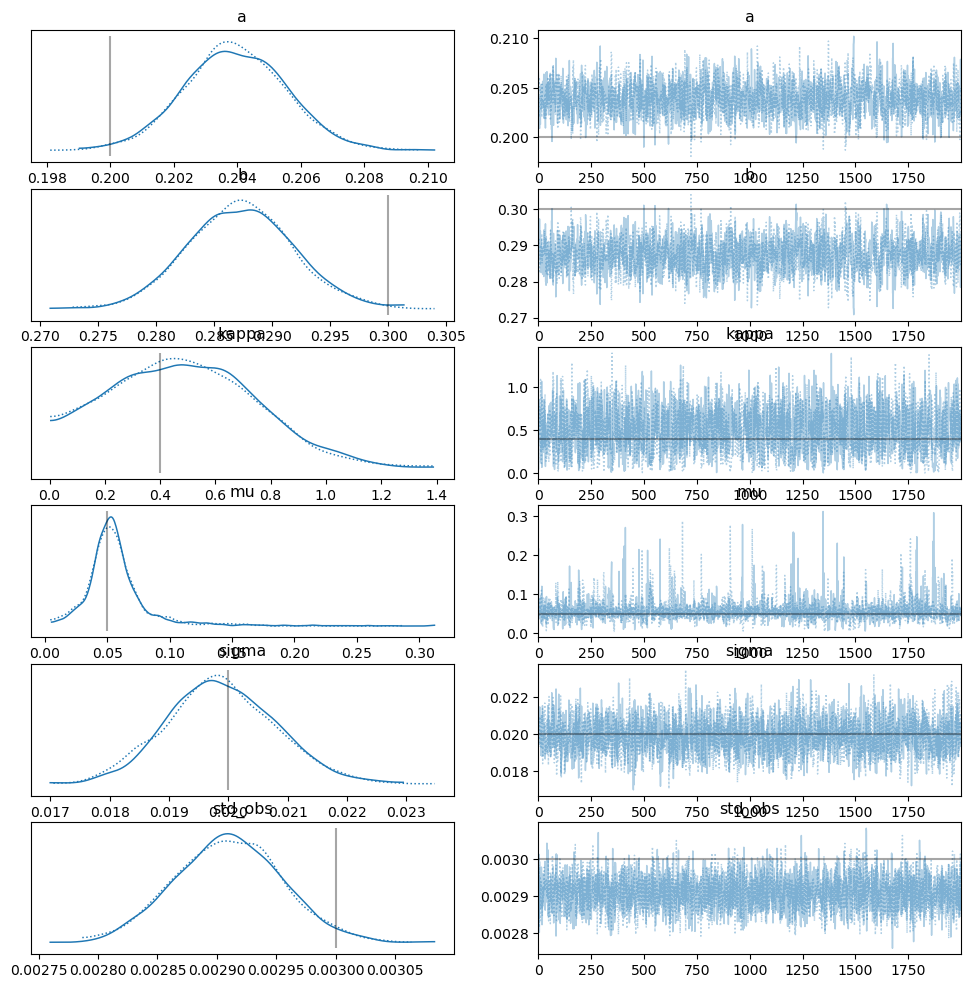

In [11]:
lines= (('a',{}, [a_sim]),('b',{},[b_sim]),('sigma',{},[sigma_sim]),('kappa',{},[kappa_sim]),('mu',{},[mu_sim]),('std_obs',{},[sigma_obs]))
az.plot_trace(vasicek_sim_data, var_names=['a','b','kappa','mu','sigma','std_obs'], lines=lines)

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


array([[<Axes: title={'center': 'a\n0'}>,
        <Axes: title={'center': 'a\n1'}>,
        <Axes: title={'center': 'b\n0'}>],
       [<Axes: title={'center': 'b\n1'}>,
        <Axes: title={'center': 'kappa\n0'}>,
        <Axes: title={'center': 'kappa\n1'}>],
       [<Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'sigma\n0'}>],
       [<Axes: title={'center': 'sigma\n1'}>,
        <Axes: title={'center': 'std_obs\n0'}>,
        <Axes: title={'center': 'std_obs\n1'}>]], dtype=object)

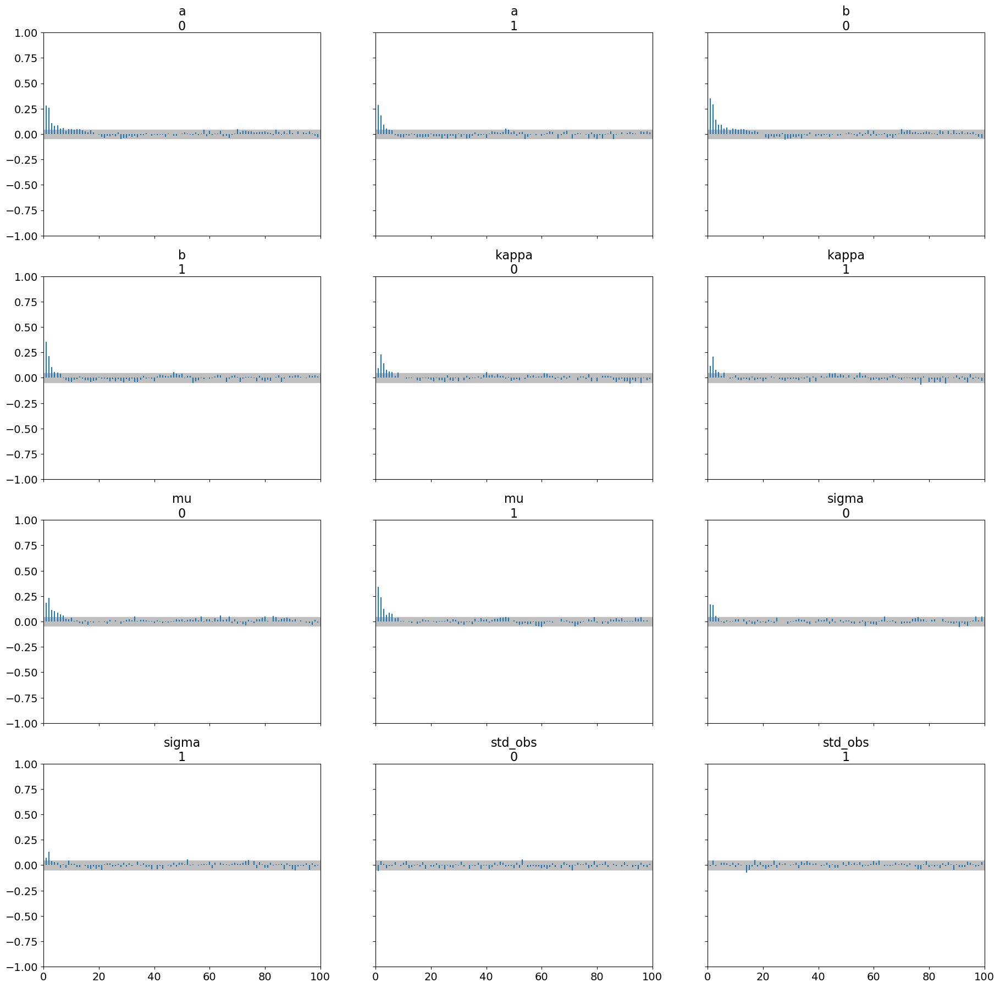

In [12]:
az.plot_autocorr(vasicek_sim_data,var_names=['~r','~P'])

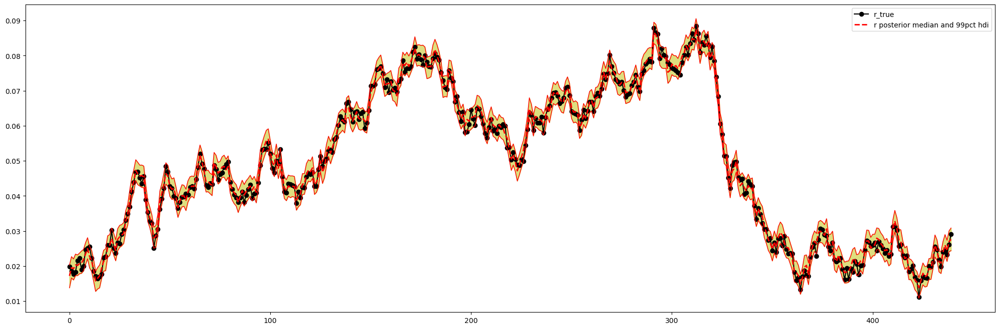

In [13]:
posterior_median = np.array(np.median(vasicek_sim_trace.posterior['r'].to_numpy(),axis=(0,1)))

posterior_hpd_lower = az.hdi(vasicek_sim_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[0]

posterior_hpd_upper = az.hdi(vasicek_sim_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(r_sim,'k', label='r_true',marker="o")
plt.plot(posterior_median, 'r', lw=2, label="r posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper, "r", lw=1)
plt.plot(posterior_hpd_lower, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower, posterior_hpd_upper, color="y", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

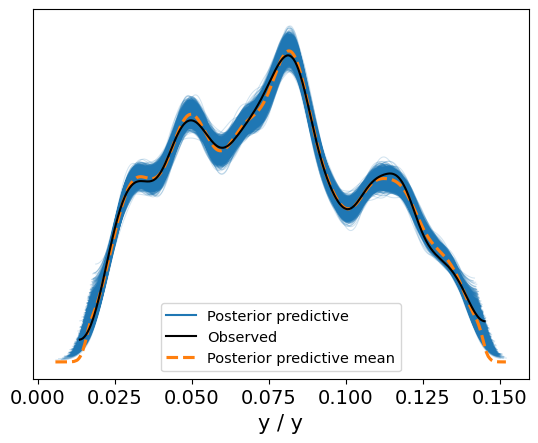

In [14]:
az.plot_ppc(vasicek_sim_ppc)

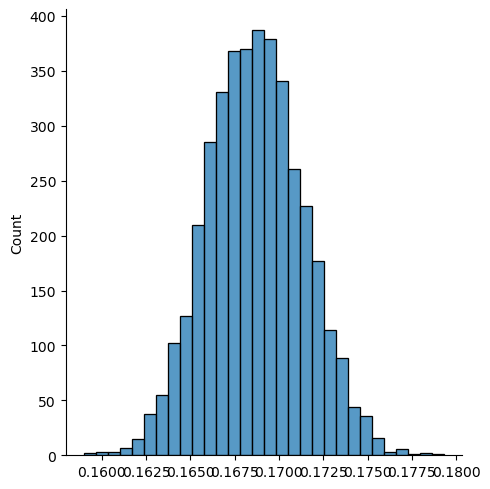

In [15]:
rmse_post_draws_vasicek = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_vasicek.append(np.sum(np.sqrt((vasicek_sim_ppc.posterior_predictive['y'][i][j].T - Y_sim)**2/(len(TTM)*T))))
rmse_post_draws_vasicek = np.array(rmse_post_draws_vasicek)
sns.displot(rmse_post_draws_vasicek, bins=30)

In [16]:
t = 0
for i in range(len(r_sim)):
    if (posterior_hpd_lower[i] < r_sim[i] < posterior_hpd_upper[i]):
        t += 1
t

433

CIR

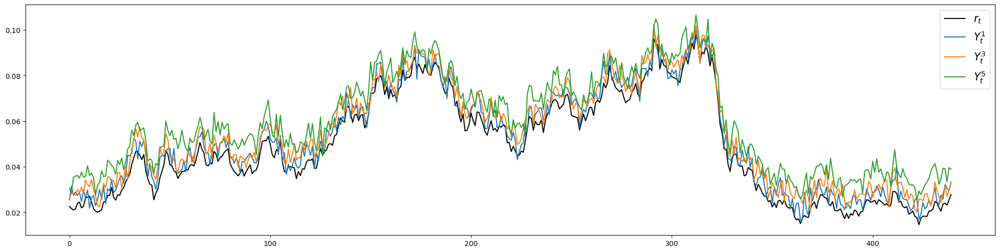

In [17]:
dt = 1/52 #weekly data

np.random.seed(123)
kappa_sim = 0.4
mu_sim = 0.05
sigma_sim = 0.1
a_sim = 0.2
b_sim = 0.3
sigma_obs = 0.003
r0_sim = 0.08

T = 440

r_sim = np.zeros(2*T)
r_sim[0] = r0_sim + kappa_sim*(mu_sim - r0_sim)*dt + (sigma_sim * np.sqrt(r0_sim) * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    r_sim[i + 1] = r_sim[i] + kappa_sim*(mu_sim - r_sim[i])*dt + (sigma_sim * np.sqrt(np.abs(r_sim[i])) * np.sqrt(dt) * np.random.randn())
r0_sim=r_sim[T-1]
r_sim = r_sim[T:]
r_sim = r_sim.reshape((T,1))

def gamma(beta, sigma):
    return np.sqrt(beta**2 + 2*sigma**2)

def g(beta,sigma,tau):
    return 2*gamma(beta,sigma) - (beta - gamma(beta,sigma)) * (np.exp(-gamma(beta,sigma)*tau)-1)

def B(beta,sigma,tau):
    return 2*(np.exp(-gamma(beta,sigma)*tau)-1)/g(beta,sigma,tau)

def A(beta,alpha,sigma,tau):
    return (2*beta*alpha/(sigma**2)) * np.log(2*gamma(beta,sigma)*np.exp((beta-gamma(beta,sigma))*tau/2)/g(beta,sigma,tau))

TTM = np.array([1/6,1/4,1/2,1,3,5])
y_mean_sim = lambda tau: -(A(b_sim,a_sim,sigma_sim,tau) + B(b_sim,sigma_sim,tau)*r_sim)/tau

Y_sim = y_mean_sim(TTM) + (sigma_obs * np.random.randn(T,len(TTM)))
    
plt.figure(figsize=(25,6))
plt.plot(r_sim, label=r'$r_t$', color="black")
plt.plot(Y_sim[:,0], label=r'$Y^1_t$')
plt.plot(Y_sim[:,1], label=r'$Y^3_t$')
plt.plot(Y_sim[:,2], label=r'$Y^5_t$')
plt.legend(prop={'size': 15})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(


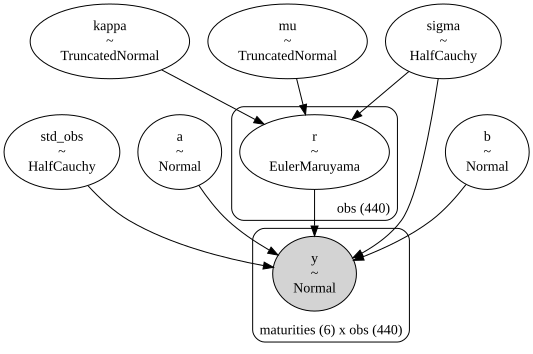

In [18]:
def CIR_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma*pm.math.sqrt(pm.math.abs(x))

def gamma(beta, sigma):
    return pm.math.sqrt(pm.math.sqr(beta) + 2*pm.math.sqr(sigma))

def g(beta,sigma,tau):
    return 2*gamma(beta,sigma) + (beta + gamma(beta,sigma)) * (pm.math.exp(gamma(beta,sigma)*tau)-1)

def B(beta,sigma,tau):
    return 2*(pm.math.exp(gamma(beta,sigma)*tau)-1)/g(beta,sigma,tau)

def A(beta,alpha,sigma,tau):
    return (2*beta*alpha/pm.math.sqr(sigma)) * pm.math.log(2*gamma(beta,sigma)*pm.math.exp((beta+gamma(beta,sigma))*tau/2)/g(beta,sigma,tau))

dt = 1/52

T = len(r_sim)
coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

with pm.Model(coords=coords) as CIR_sim_model:

    kappa = pm.TruncatedNormal('kappa', mu = 0.7, sigma = 0.4, lower=0, upper=2/dt)
    sigma = pm.HalfCauchy('sigma', beta = 0.1)
    mu = pm.TruncatedNormal('mu', mu = 0.08, sigma=0.1, lower=0)
    a = pm.Normal('a', mu = 0.1, sigma = 0.1)
    b = pm.Normal('b', mu = 0.5, sigma = 1)

    r = pm.distributions.timeseries.EulerMaruyama("r", dt, CIR_coeffs, (kappa, mu, sigma,), shape=T, dims="obs", initval=np.repeat(0.04,T))

    y_mean = lambda tau: -(A(b,a,sigma,tau) - B(b,sigma,tau)*r)/tau
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.008)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, dims=('maturities','obs'), shape=(len(TTM),T), observed=Y_sim.T)
    
pm.model_to_graphviz(CIR_sim_model)

In [20]:
prior_samples = 20

with CIR_sim_model:
    CIR_sim_prior = pm.sample_prior_predictive(var_names=['a','b','kappa','mu','sigma'], samples = prior_samples).to_dataframe()

Sampling: [a, b, kappa, mu, sigma]


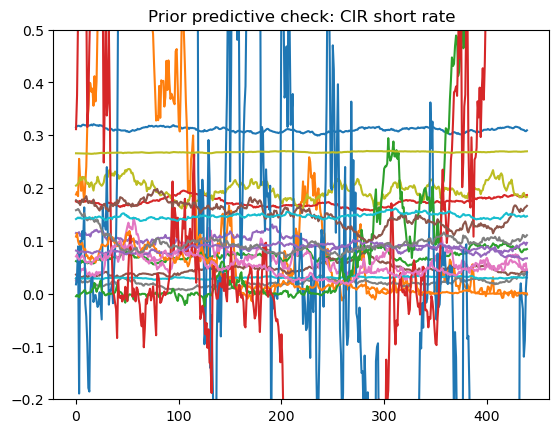

In [21]:
r0_prior = 0.04
dt = 1/52
T = 440

r_prior_sim = np.zeros([2*T,prior_samples])
for j in range(0,prior_samples):
    r_prior_sim[0,j] = r0_prior + CIR_sim_prior["kappa"][j]*(CIR_sim_prior["mu"][j] - r0_prior)*dt + (CIR_sim_prior["sigma"][j] * np.sqrt(r0_prior) * np.sqrt(dt) * np.random.randn())
    for i in range(0, 2*T - 1):
        r_prior_sim[i+1,j] = r_prior_sim[i,j] + CIR_sim_prior["kappa"][j]*(CIR_sim_prior["mu"][j] - r_prior_sim[i,j])*dt + (CIR_sim_prior["sigma"][j] * np.sqrt(np.abs(r_prior_sim[i,j])) * np.sqrt(dt) * np.random.randn())
r_prior_sim = r_prior_sim[T:]

plt.ylim(-0.2,0.5)
plt.plot(r_prior_sim)
plt.title("Prior predictive check: CIR short rate")
plt.show()

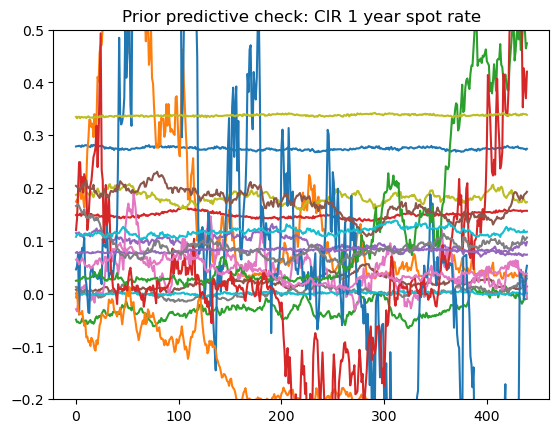

In [22]:
tau = 1

def gamma_num(beta, sigma):
    return np.sqrt(beta**2 + 2*sigma**2)

def g_num(beta,sigma,tau):
    return 2*gamma_num(beta,sigma) + (beta + gamma_num(beta,sigma)) * (np.exp(gamma_num(beta,sigma)*tau)-1)

def B_num(beta,sigma,tau):
    return 2*(np.exp(gamma_num(beta,sigma)*tau)-1)/g_num(beta,sigma,tau)

def A_num(beta,alpha,sigma,tau):
    return (2*beta*alpha/sigma**2) * np.log(2*gamma_num(beta,sigma)*np.exp((beta+gamma_num(beta,sigma))*tau/2)/g_num(beta,sigma,tau))

Y_prior_sim = -(A_num(CIR_sim_prior["b"].to_numpy(),CIR_sim_prior["a"].to_numpy(),CIR_sim_prior["sigma"].to_numpy(),tau) - B_num(CIR_sim_prior["b"].to_numpy(),CIR_sim_prior['sigma'].to_numpy(),tau)*r_prior_sim)/tau + (np.random.normal(scale=0.001,size=(T,prior_samples)))

plt.ylim(-0.2,0.5)
plt.plot(Y_prior_sim)
plt.title("Prior predictive check: CIR 1 year spot rate")
plt.show()

In [23]:
chains = 2
draws = 2000

with CIR_sim_model:
    CIR_sim_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.9, chains=chains, return_inferencedata=True, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [kappa, sigma, mu, a, b, r, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 122 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [24]:
with CIR_sim_model:
    CIR_sim_ppc = pm.sample_posterior_predictive(trace=CIR_sim_trace)
    CIR_sim_data = CIR_sim_trace

Sampling: [y]


In [115]:
az.summary(CIR_sim_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
a,0.204,0.002,0.200,0.209,0.000,0.000,1040.0,1992.0,1.0,0.204
b,0.287,0.005,0.274,0.299,0.000,0.000,933.0,1769.0,1.0,0.287
kappa,0.472,0.261,0.000,1.112,0.006,0.004,1780.0,1649.0,1.0,0.462
sigma,0.100,0.004,0.089,0.113,0.000,0.000,2157.0,2504.0,1.0,0.100
mu,0.061,0.033,0.001,0.203,0.001,0.001,2063.0,1305.0,1.0,0.053
std_obs,0.003,0.000,0.003,0.003,0.000,0.000,4473.0,2869.0,1.0,0.003


In [116]:
az.summary(CIR_sim_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(
C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\1345650887.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(CIR_sim_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &   mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\na       &  0.204 &  0.002 &     0.200 &      0.209 &      0.000 &    0.000 &    1040.0 &    1992.0 &    1.0 &   0.204 \\\\\nb       &  0.287 &  0.005 &     0.274 &      0.299 &      0.000 &    0.000 &     933.0 &    1769.0 &    1.0 &   0.287 \\\\\nkappa   &  0.472 &  0.261 &     0.000 &      1.112 &      0.006 &    0.004 &    1780.0 &    1649.0 &    1.0 &   0.462 \\\\\nsigma   &  0.100 &  0.004 &     0.089 &      0.113 &      0.000 &    0.000 &    2157.0 &    2504.0 &    1.0 &   0.100 \\\\\nmu      &  0.061 &  0.033 &     0.001 &      0.203 &      0.001 &    0.001 &    2063.0 &    1305.0 &    1.0 &   0.053 \\\\\nstd\\_obs &  0.003 &  0.000 &     0.003 &      0.003 &      0.000 &    0.000 &    4473.0 &    2869.0 &    1.0 &   0.003 \\\\\n\\bottomrule\n\\end{tabular}\n'

array([[<Axes: title={'center': 'a'}>, <Axes: title={'center': 'a'}>],
       [<Axes: title={'center': 'b'}>, <Axes: title={'center': 'b'}>],
       [<Axes: title={'center': 'kappa'}>,
        <Axes: title={'center': 'kappa'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'std_obs'}>,
        <Axes: title={'center': 'std_obs'}>]], dtype=object)

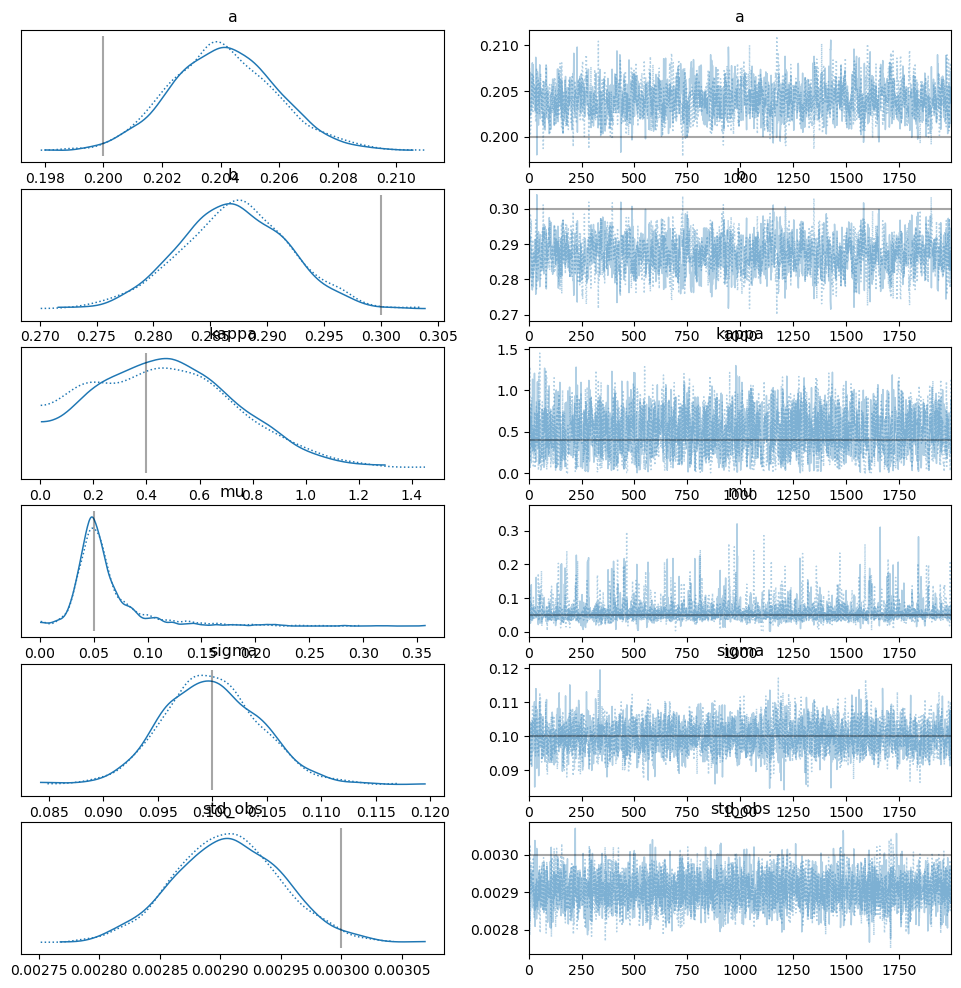

In [27]:
lines= (('a',{}, [a_sim]),('b',{},[b_sim]),('sigma',{},[sigma_sim]),('kappa',{},[kappa_sim]),('mu',{},[mu_sim]),('std_obs',{},[sigma_obs]))
az.plot_trace(CIR_sim_data, var_names=['a','b','kappa','mu','sigma','std_obs'], lines=lines)

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


array([[<Axes: title={'center': 'a\n0'}>,
        <Axes: title={'center': 'a\n1'}>,
        <Axes: title={'center': 'b\n0'}>],
       [<Axes: title={'center': 'b\n1'}>,
        <Axes: title={'center': 'kappa\n0'}>,
        <Axes: title={'center': 'kappa\n1'}>],
       [<Axes: title={'center': 'sigma\n0'}>,
        <Axes: title={'center': 'sigma\n1'}>,
        <Axes: title={'center': 'mu\n0'}>],
       [<Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'std_obs\n0'}>,
        <Axes: title={'center': 'std_obs\n1'}>]], dtype=object)

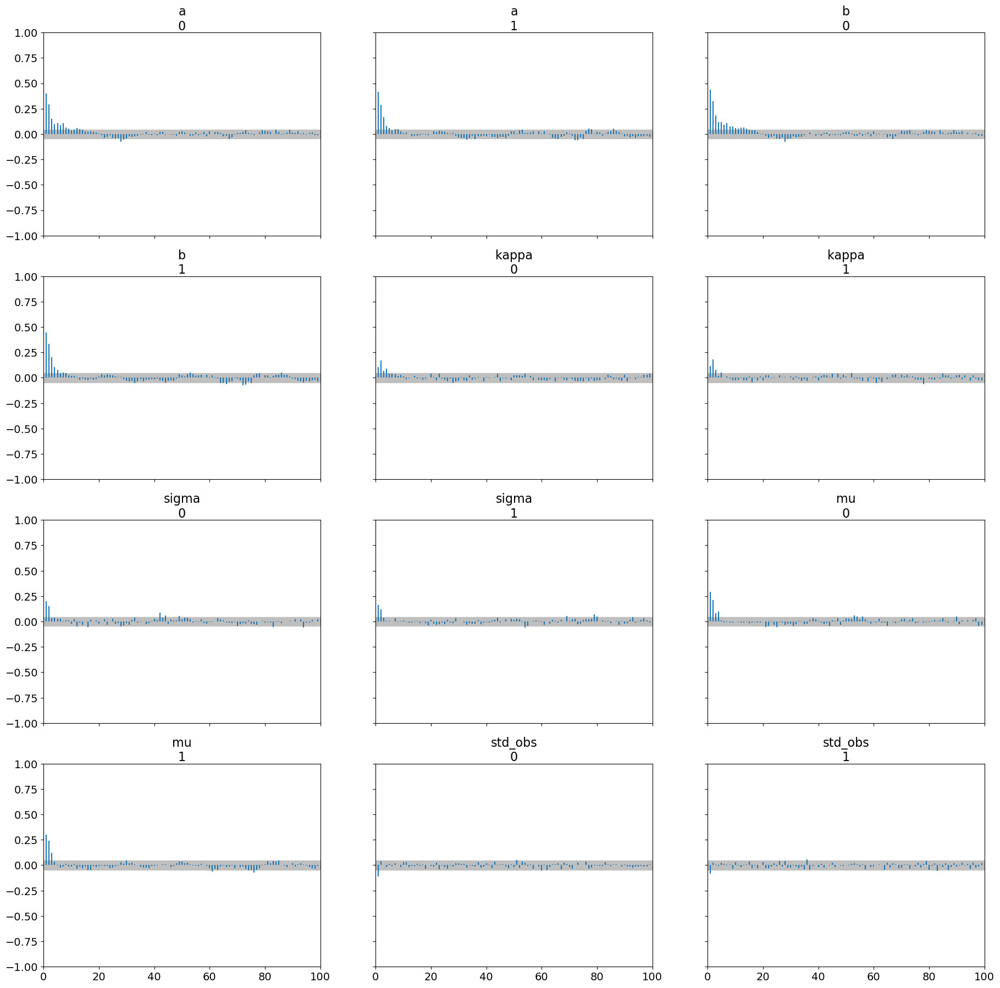

In [28]:
az.plot_autocorr(CIR_sim_data,var_names=['~r','~P'])

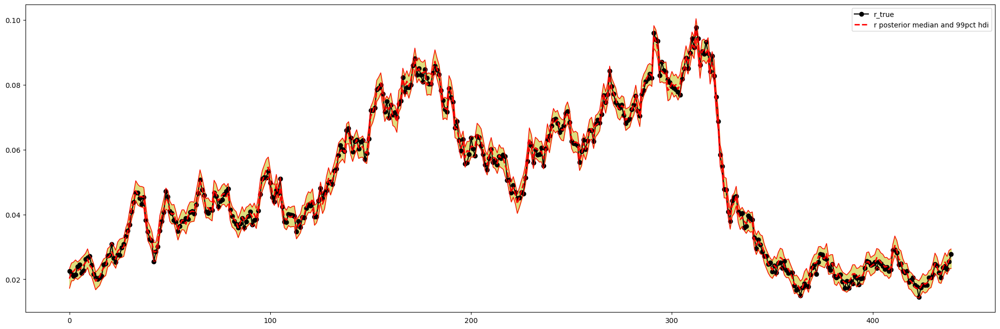

In [29]:
posterior_median = np.array(np.median(CIR_sim_trace.posterior['r'].to_numpy(),axis=(0,1)))

posterior_hpd_lower = az.hdi(CIR_sim_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[0]

posterior_hpd_upper = az.hdi(CIR_sim_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(r_sim,'k', label='r_true',marker="o")
plt.plot(posterior_median, 'r', lw=2, label="r posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper, "r", lw=1)
plt.plot(posterior_hpd_lower, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower, posterior_hpd_upper, color="y", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

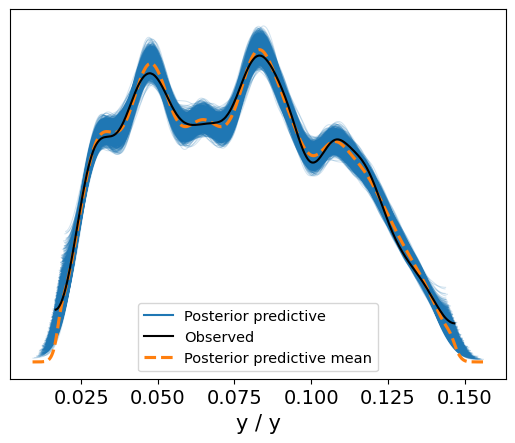

In [30]:
az.plot_ppc(CIR_sim_ppc)

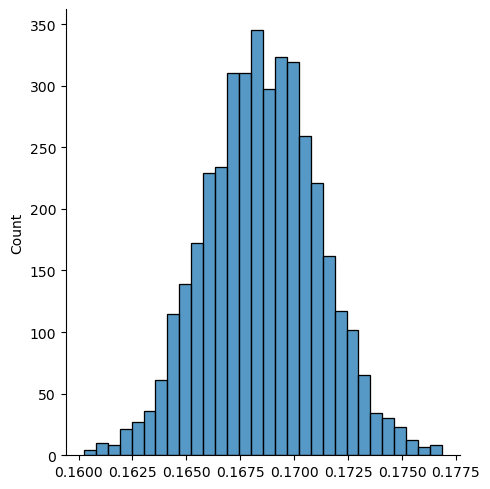

In [31]:
rmse_post_draws_CIR = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_CIR.append(np.sum(np.sqrt((CIR_sim_ppc.posterior_predictive['y'][i][j].T - Y_sim)**2/(len(TTM)*T))))
rmse_post_draws_CIR = np.array(rmse_post_draws_CIR)
sns.displot(rmse_post_draws_CIR, bins=30)

In [32]:
t = 0
for i in range(len(r_sim)):
    if (posterior_hpd_lower[i] < r_sim[i] < posterior_hpd_upper[i]):
        t += 1
t

435

Diebold-Li ($\lambda$ estático)

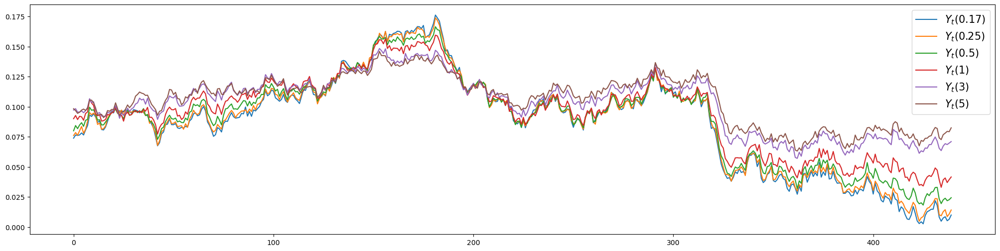

In [33]:
dt = 1/52 #weekly data

np.random.seed(123)
kappa_l_sim = 0.8
mu_l_sim = 0.11
sigma_l_sim = 0.02
kappa_s_sim = 0.6
mu_s_sim = -0.03
sigma_s_sim = 0.03
kappa_c_sim = 0.4
mu_c_sim = -0.03
sigma_c_sim = 0.04
sigma_obs = 0.001
l0_sim = 0.12
s0_sim = -0.01
c0_sim = -0.1

T = 440

l_sim = np.zeros(2*T)
l_sim[0] = l0_sim + kappa_l_sim*(mu_l_sim - l0_sim)*dt + (sigma_l_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    l_sim[i + 1] = l_sim[i] + kappa_l_sim*(mu_l_sim - l_sim[i])*dt + (sigma_l_sim * np.sqrt(dt) * np.random.randn())
l0_sim=l_sim[T-1]
l_sim = l_sim[T:]
l_sim = l_sim.reshape((T,1))

s_sim = np.zeros(2*T)
s_sim[0] = s0_sim + kappa_s_sim*(mu_s_sim - s0_sim)*dt + (sigma_s_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    s_sim[i + 1] = s_sim[i] + kappa_s_sim*(mu_s_sim - s_sim[i])*dt + (sigma_s_sim * np.sqrt(dt) * np.random.randn())
s0_sim=s_sim[T-1]
s_sim = s_sim[T:]
s_sim = s_sim.reshape((T,1))

c_sim = np.zeros(2*T)
c_sim[0] = c0_sim + kappa_c_sim*(mu_c_sim - c0_sim)*dt + (sigma_c_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    c_sim[i + 1] = c_sim[i] + kappa_c_sim*(mu_c_sim - c_sim[i])*dt + (sigma_c_sim * np.sqrt(dt) * np.random.randn())
c0_sim=c_sim[T-1]
c_sim = c_sim[T:]
c_sim = c_sim.reshape((T,1))

TTM = np.array([1/6,1/4,1/2,1,3,5])
lamb_ns_sim = 1.2
y_mean_sim = lambda tau: l_sim + s_sim*((1-np.exp(-lamb_ns_sim*tau))/(lamb_ns_sim*tau)) + c_sim*(((1-np.exp(-lamb_ns_sim*tau))/(lamb_ns_sim*tau)) - np.exp(-lamb_ns_sim*tau))

Y_sim = y_mean_sim(TTM) + (sigma_obs * np.random.randn(T,len(TTM)))
    
plt.figure(figsize=(25,6))
plt.plot(Y_sim, label=[r'$Y_t(0.17)$',r'$Y_t(0.25)$',r'$Y_t(0.5)$',r'$Y_t(1)$',r'$Y_t(3)$',r'$Y_t(5)$'])
plt.legend(prop={'size': 15})

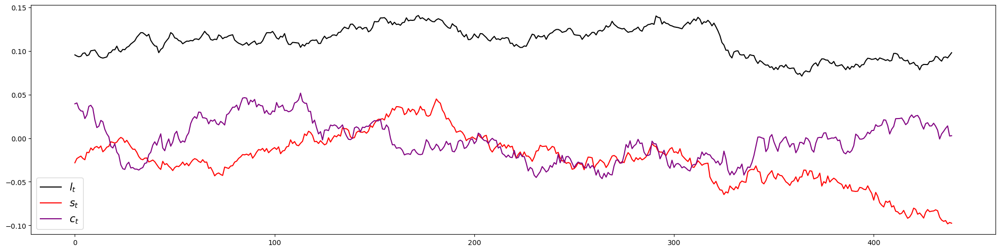

In [34]:
plt.figure(figsize=(25,6))
plt.plot(l_sim, label=r'$l_t$', color="black")
plt.plot(s_sim, label=r'$s_t$', color="red")
plt.plot(c_sim, label=r'$c_t$', color="purple")
plt.legend(prop={'size': 15})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(


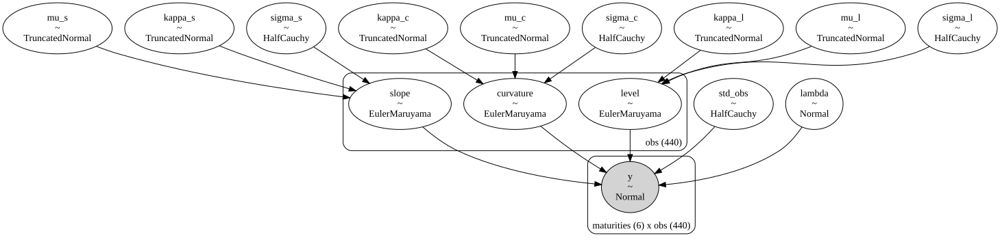

In [35]:
def ou_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma

dt = 1/52

coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

with pm.Model(coords=coords) as dns_sl_sim_model:

    kappa_l = pm.TruncatedNormal('kappa_l', mu = 1, sigma = 1, lower=0, upper=2/dt)
    mu_l = pm.TruncatedNormal('mu_l', mu = 0.12, sigma=0.05, lower=-0.5)
    sigma_l = pm.HalfCauchy('sigma_l', beta = 0.015)
    kappa_s = pm.TruncatedNormal('kappa_s', mu = 0.8, sigma = 0.5, lower=0, upper=2/dt)
    mu_s = pm.TruncatedNormal('mu_s', mu = -0.04, sigma=0.03, upper=0.5)
    sigma_s = pm.HalfCauchy('sigma_s', beta = 0.015)
    kappa_c = pm.TruncatedNormal('kappa_c', mu = 0.5, sigma = 0.4, lower=0, upper=2/dt)
    mu_c = pm.TruncatedNormal('mu_c', mu = -0.03, sigma=0.04, upper=0.5)
    sigma_c = pm.HalfCauchy('sigma_c', beta = 0.015)
    
    lamb_ns = pm.Normal('lambda', mu = 1.1, sigma = 0.3)

    l = pm.distributions.timeseries.EulerMaruyama("level", dt, ou_coeffs, (kappa_l, mu_l, sigma_l,), dims='obs', shape=T, initval=np.repeat(0.1,T))
    s = pm.distributions.timeseries.EulerMaruyama("slope", dt, ou_coeffs, (kappa_s, mu_s, sigma_s,), dims='obs', shape=T, initval=np.repeat(-0.05,T))
    c = pm.distributions.timeseries.EulerMaruyama("curvature", dt, ou_coeffs, (kappa_c, mu_c, sigma_c,), dims='obs', shape=T, initval=np.repeat(-0.05,T))

    y_mean = lambda tau: l + s*((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) + c*(((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) - pm.math.exp(-lamb_ns*tau))
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.005)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, shape=(len(TTM),T), dims=("maturities","obs"), observed=Y_sim.T)
    
pm.model_to_graphviz(dns_sl_sim_model)

In [36]:
prior_samples = 20
with dns_sl_sim_model:
    dns_sl_sim_prior = pm.sample_prior_predictive(var_names=['sigma_c','mu_c','kappa_c','sigma_s','mu_s','kappa_s','sigma_l','mu_l','kappa_l','lambda','std_obs'],samples=prior_samples).to_dataframe()

Sampling: [kappa_c, kappa_l, kappa_s, lambda, mu_c, mu_l, mu_s, sigma_c, sigma_l, sigma_s, std_obs]


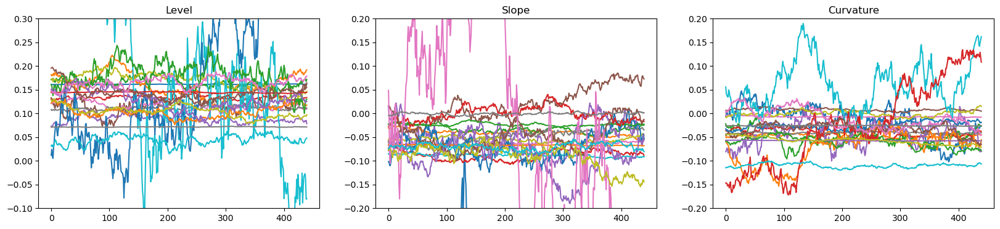

In [37]:
l0_prior = 0.14
s0_prior = -0.05
c0_prior = -0.05
dt = 1/52
T = 440

l_prior_sim = np.zeros([2*T,prior_samples])
for j in range(0,prior_samples):
    l_prior_sim[0,j] = l0_prior + dns_sl_sim_prior["kappa_l"][j]*(dns_sl_sim_prior["mu_l"][j] - l0_prior)*dt + (dns_sl_sim_prior["sigma_l"][j] * np.sqrt(dt) * np.random.randn())
    for i in range(0, 2*T - 1):
        l_prior_sim[i+1,j] = l_prior_sim[i,j] + dns_sl_sim_prior["kappa_l"][j]*(dns_sl_sim_prior["mu_l"][j] - l_prior_sim[i,j])*dt + (dns_sl_sim_prior["sigma_l"][j] * np.sqrt(dt) * np.random.randn())
l_prior_sim = l_prior_sim[T:]

s_prior_sim = np.zeros([2*T,prior_samples])
for j in range(0,prior_samples):
    s_prior_sim[0,j] = s0_prior + dns_sl_sim_prior["kappa_s"][j]*(dns_sl_sim_prior["mu_s"][j] - s0_prior)*dt + (dns_sl_sim_prior["sigma_s"][j] * np.sqrt(dt) * np.random.randn())
    for i in range(0, 2*T - 1):
        s_prior_sim[i+1,j] = s_prior_sim[i,j] + dns_sl_sim_prior["kappa_s"][j]*(dns_sl_sim_prior["mu_s"][j] - s_prior_sim[i,j])*dt + (dns_sl_sim_prior["sigma_s"][j] * np.sqrt(dt) * np.random.randn())
s_prior_sim = s_prior_sim[T:]

c_prior_sim = np.zeros([2*T,prior_samples])
for j in range(0,prior_samples):
    c_prior_sim[0,j] = c0_prior + dns_sl_sim_prior["kappa_c"][j]*(dns_sl_sim_prior["mu_c"][j] - c0_prior)*dt + (dns_sl_sim_prior["sigma_c"][j] * np.sqrt(dt) * np.random.randn())
    for i in range(0, 2*T - 1):
        c_prior_sim[i+1,j] = c_prior_sim[i,j] + dns_sl_sim_prior["kappa_c"][j]*(dns_sl_sim_prior["mu_c"][j] - c_prior_sim[i,j])*dt + (dns_sl_sim_prior["sigma_c"][j] * np.sqrt(dt) * np.random.randn())
c_prior_sim = c_prior_sim[T:]

plt.figure(figsize=(20,4))
#plt.suptitle("Prior predictive checks: DNS factors")
plt.subplot(1,3,1).set_title("Level")
plt.ylim(-0.1,0.3)
plt.plot(l_prior_sim)
plt.subplot(1,3,2).set_title("Slope")
plt.ylim(-0.2,0.2)
plt.plot(s_prior_sim)
plt.subplot(1,3,3).set_title("Curvature")
plt.ylim(-0.2,0.2)
plt.plot(c_prior_sim)
plt.show()

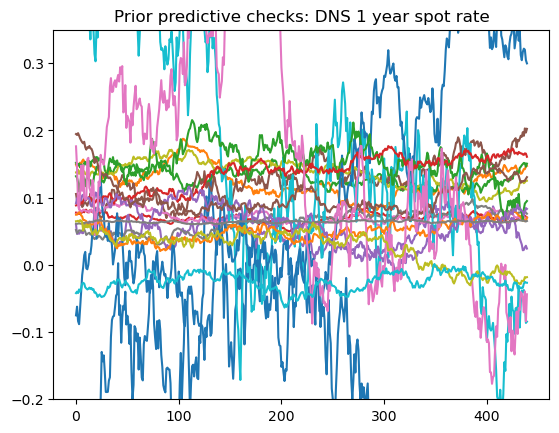

In [38]:
tau = 1

lamb_ns_prior = dns_sl_sim_prior["lambda"].values.reshape(-1,1)
Y_prior_sim = (l_prior_sim.T + s_prior_sim.T*((1-np.exp(-lamb_ns_prior*tau))/(lamb_ns_prior*tau)) + c_prior_sim.T*(((1-np.exp(-lamb_ns_prior*tau))/(lamb_ns_prior*tau)) - np.exp(-lamb_ns_prior*tau))).T

plt.ylim(-0.2,0.35)
plt.plot(Y_prior_sim)
plt.title("Prior predictive checks: DNS 1 year spot rate")
plt.show()

In [39]:
chains = 2
draws = 2000

with dns_sl_sim_model:
    dns_sl_sim_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.95, chains=chains, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [kappa_l, mu_l, sigma_l, kappa_s, mu_s, sigma_s, kappa_c, mu_c, sigma_c, lambda, level, slope, curvature, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 335 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [40]:
with dns_sl_sim_model:
    dns_sl_sim_ppc = pm.sample_posterior_predictive(trace=dns_sl_sim_trace)
    dns_sl_sim_data = dns_sl_sim_trace

Sampling: [y]


In [117]:
az.summary(dns_sl_sim_data,var_names=['~level','~slope','~curvature'], hdi_prob=0.99, stat_funcs={"median":np.median})

,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
lambda,1.220,0.031,1.142,1.297,0.002,0.002,197.0,424.0,1.02,1.222
kappa_l,0.580,0.359,0.000,1.501,0.009,0.006,1282.0,1288.0,1.00,0.540
mu_l,0.113,0.020,0.049,0.191,0.001,0.000,2004.0,1481.0,1.00,0.112
sigma_l,0.020,0.001,0.018,0.023,0.000,0.000,4275.0,3498.0,1.00,0.020
kappa_s,0.310,0.195,0.000,0.858,0.003,0.002,3104.0,2015.0,1.00,0.283
mu_s,-0.043,0.024,-0.109,0.019,0.000,0.000,6127.0,2687.0,1.00,-0.042
sigma_s,0.027,0.001,0.025,0.030,0.000,0.000,6304.0,3528.0,1.00,0.027
kappa_c,0.706,0.313,0.005,1.473,0.006,0.004,2275.0,1476.0,1.00,0.696
mu_c,-0.014,0.019,-0.079,0.038,0.000,0.000,3220.0,2270.0,1.00,-0.013
sigma_c,0.034,0.003,0.028,0.042,0.000,0.000,1032.0,2037.0,1.00,0.034


In [118]:
az.summary(dns_sl_sim_data,var_names=['~level','~slope','~curvature'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\189414983.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(dns_sl_sim_data,var_names=['~level','~slope','~curvature'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &   mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\nlambda  &  1.220 &  0.031 &     1.142 &      1.297 &      0.002 &    0.002 &     197.0 &     424.0 &   1.02 &   1.222 \\\\\nkappa\\_l &  0.580 &  0.359 &     0.000 &      1.501 &      0.009 &    0.006 &    1282.0 &    1288.0 &   1.00 &   0.540 \\\\\nmu\\_l    &  0.113 &  0.020 &     0.049 &      0.191 &      0.001 &    0.000 &    2004.0 &    1481.0 &   1.00 &   0.112 \\\\\nsigma\\_l &  0.020 &  0.001 &     0.018 &      0.023 &      0.000 &    0.000 &    4275.0 &    3498.0 &   1.00 &   0.020 \\\\\nkappa\\_s &  0.310 &  0.195 &     0.000 &      0.858 &      0.003 &    0.002 &    3104.0 &    2015.0 &   1.00 &   0.283 \\\\\nmu\\_s    & -0.043 &  0.024 &    -0.109 &      0.019 &      0.000 &    0.000 &    6127.0 &    2687.0 &   1.00 &  -0.042 \\\\\nsigma\\_s &  0.027 &  0.001 &     0.025 &      0.030 & 

array([[<Axes: title={'center': 'lambda'}>,
        <Axes: title={'center': 'lambda'}>],
       [<Axes: title={'center': 'kappa_l'}>,
        <Axes: title={'center': 'kappa_l'}>],
       [<Axes: title={'center': 'mu_l'}>,
        <Axes: title={'center': 'mu_l'}>],
       [<Axes: title={'center': 'sigma_l'}>,
        <Axes: title={'center': 'sigma_l'}>],
       [<Axes: title={'center': 'kappa_s'}>,
        <Axes: title={'center': 'kappa_s'}>],
       [<Axes: title={'center': 'mu_s'}>,
        <Axes: title={'center': 'mu_s'}>],
       [<Axes: title={'center': 'sigma_s'}>,
        <Axes: title={'center': 'sigma_s'}>],
       [<Axes: title={'center': 'kappa_c'}>,
        <Axes: title={'center': 'kappa_c'}>],
       [<Axes: title={'center': 'mu_c'}>,
        <Axes: title={'center': 'mu_c'}>],
       [<Axes: title={'center': 'sigma_c'}>,
        <Axes: title={'center': 'sigma_c'}>],
       [<Axes: title={'center': 'std_obs'}>,
        <Axes: title={'center': 'std_obs'}>]], dtype=object)

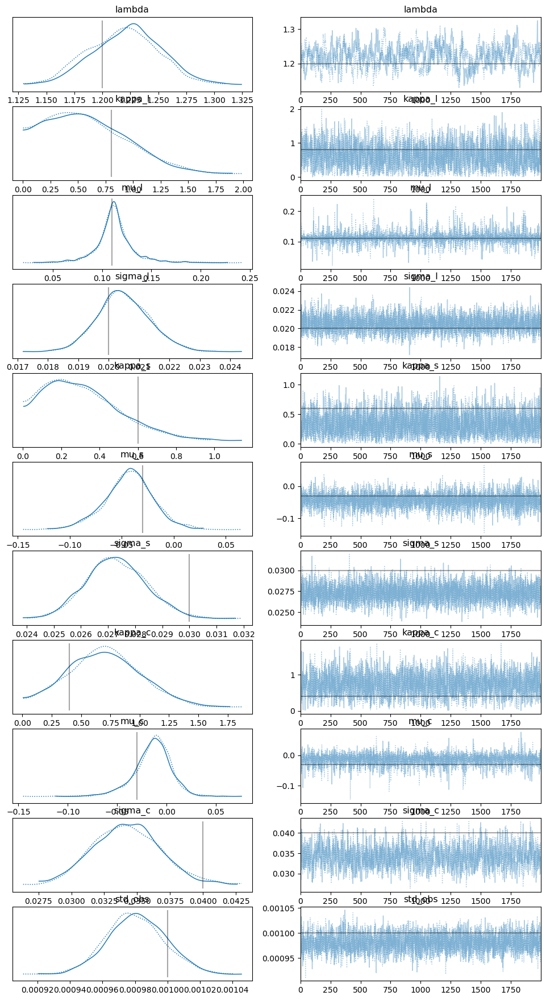

In [43]:
lines= (('kappa_l',{}, [kappa_l_sim]),('mu_l',{},[mu_l_sim]),('sigma_l',{},[sigma_l_sim]),('kappa_s',{}, [kappa_s_sim]),('mu_s',{},[mu_s_sim]),('sigma_s',{},[sigma_s_sim]),('kappa_c',{}, [kappa_c_sim]),('mu_c',{},[mu_c_sim]),('sigma_c',{},[sigma_c_sim]),('lambda',{},[lamb_ns_sim]),('std_obs',{},[sigma_obs]))
az.plot_trace(dns_sl_sim_data, var_names=['~level','~slope','~curvature'],lines=lines)

array([[<Axes: title={'center': 'lambda\n0'}>,
        <Axes: title={'center': 'lambda\n1'}>,
        <Axes: title={'center': 'kappa_l\n0'}>,
        <Axes: title={'center': 'kappa_l\n1'}>],
       [<Axes: title={'center': 'mu_l\n0'}>,
        <Axes: title={'center': 'mu_l\n1'}>,
        <Axes: title={'center': 'sigma_l\n0'}>,
        <Axes: title={'center': 'sigma_l\n1'}>],
       [<Axes: title={'center': 'kappa_s\n0'}>,
        <Axes: title={'center': 'kappa_s\n1'}>,
        <Axes: title={'center': 'mu_s\n0'}>,
        <Axes: title={'center': 'mu_s\n1'}>],
       [<Axes: title={'center': 'sigma_s\n0'}>,
        <Axes: title={'center': 'sigma_s\n1'}>,
        <Axes: title={'center': 'kappa_c\n0'}>,
        <Axes: title={'center': 'kappa_c\n1'}>],
       [<Axes: title={'center': 'mu_c\n0'}>,
        <Axes: title={'center': 'mu_c\n1'}>,
        <Axes: title={'center': 'sigma_c\n0'}>,
        <Axes: title={'center': 'sigma_c\n1'}>],
       [<Axes: title={'center': 'std_obs\n0'}>,
       

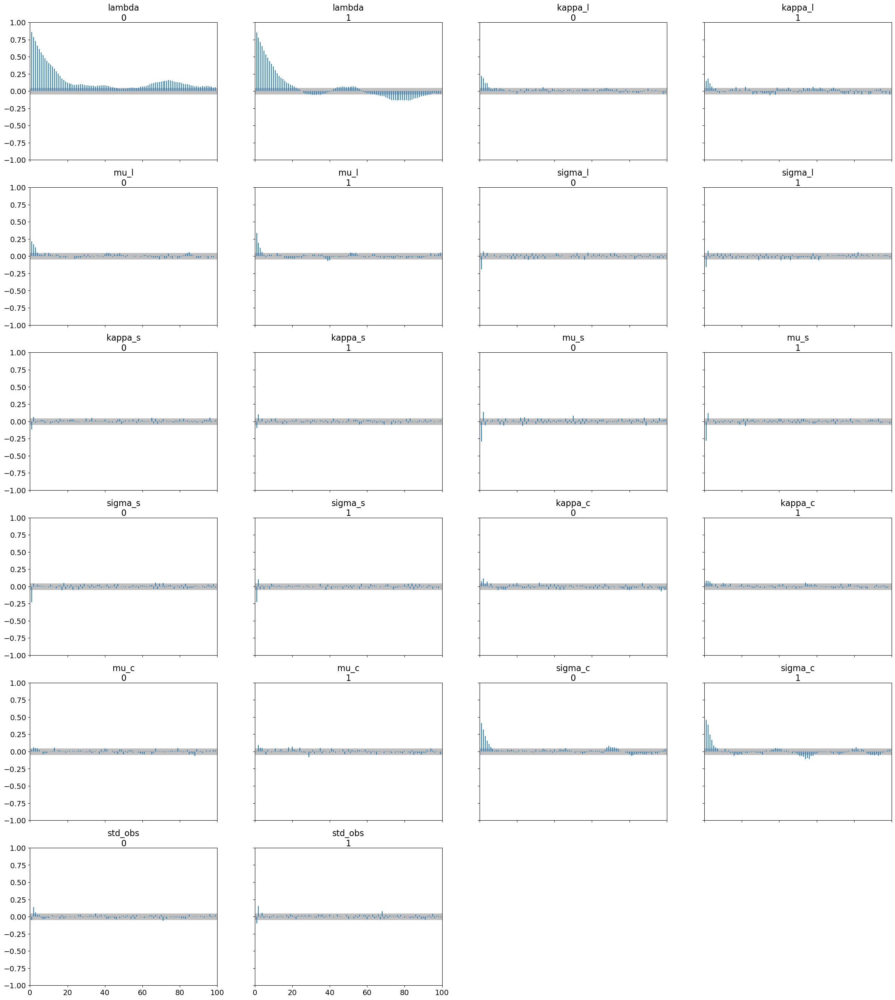

In [44]:
az.plot_autocorr(dns_sl_sim_data,var_names=['~level','~slope','~curvature'])

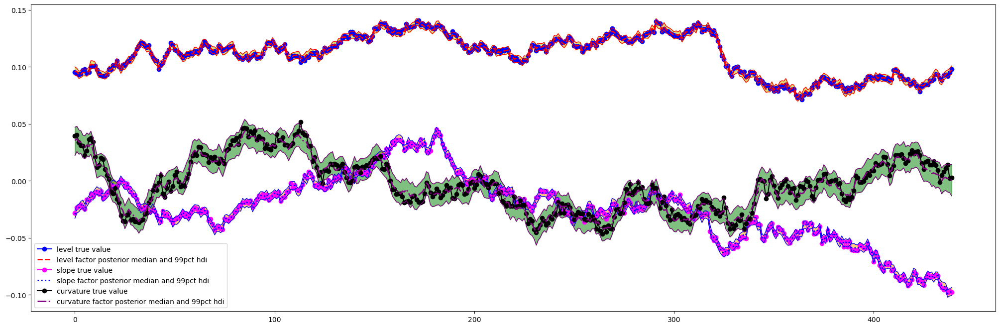

In [45]:
posterior_median_l = np.array(np.median(dns_sl_sim_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_sl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_sl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_sl_sim_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_sl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_sl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_sl_sim_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_sl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_sl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(l_sim, label='level true value',marker="o", color='blue')
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(s_sim, label='slope true value',marker="o", color='magenta')
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(c_sim, label='curvature true value',marker="o", color='black')
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

In [46]:
tl = 0
for i in range(len(l_sim)):
    if (posterior_hpd_lower_l[i] < l_sim[i] < posterior_hpd_upper_l[i]):
        tl += 1
print(tl)

ts = 0
for i in range(len(s_sim)):
    if (posterior_hpd_lower_s[i] < s_sim[i] < posterior_hpd_upper_s[i]):
        ts += 1
print(ts)

tc = 0
for i in range(len(c_sim)):
    if (posterior_hpd_lower_c[i] < c_sim[i] < posterior_hpd_upper_c[i]):
        tc += 1
print(tc)

433
433
432


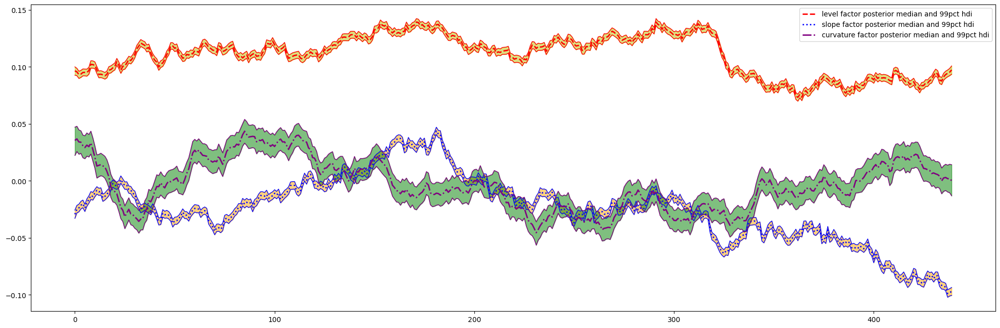

In [47]:
posterior_median_l = np.array(np.median(dns_sl_sim_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_sl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_sl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_sl_sim_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_sl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_sl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_sl_sim_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_sl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_sl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

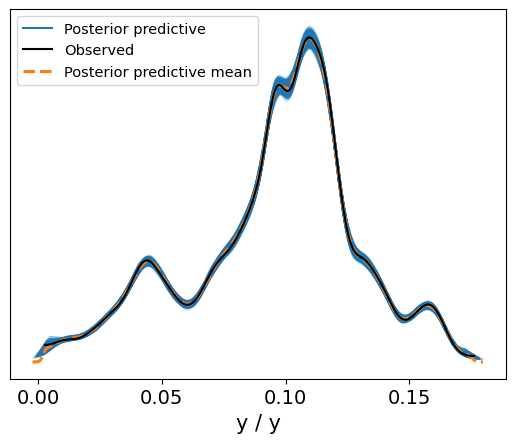

In [48]:
az.plot_ppc(dns_sl_sim_ppc)

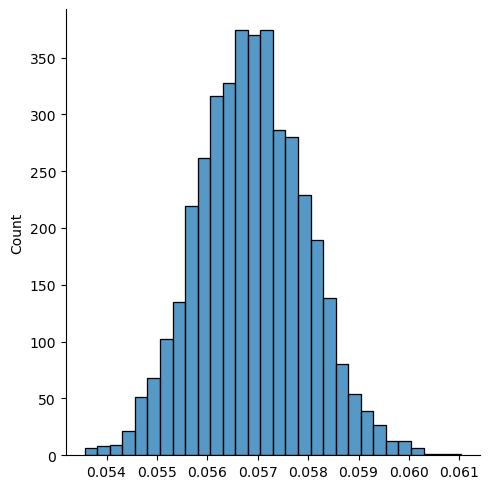

In [49]:
rmse_post_draws_dns = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_dns.append(np.sum(np.sqrt((dns_sl_sim_ppc.posterior_predictive['y'][i][j].T - Y_sim)**2/(len(TTM)*T))))
rmse_post_draws_dns = np.array(rmse_post_draws_dns)
sns.displot(rmse_post_draws_dns, bins=30)

Diebold-Li $\lambda$ dinâmico

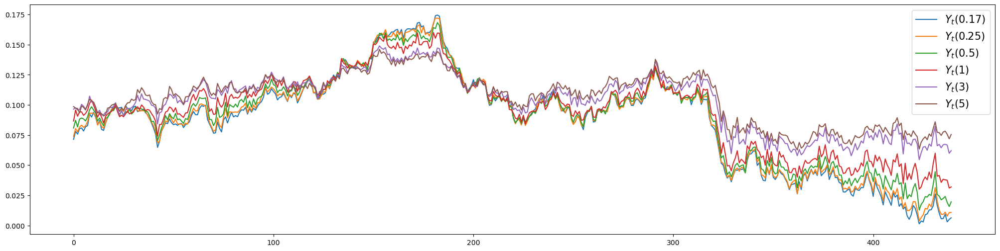

In [50]:
dt = 1/52 #weekly data

np.random.seed(123)
kappa_l_sim = 0.8
mu_l_sim = 0.11
sigma_l_sim = 0.02
kappa_s_sim = 0.6
mu_s_sim = -0.03
sigma_s_sim = 0.03
kappa_c_sim = 0.4
mu_c_sim = -0.03
sigma_c_sim = 0.04
sigma_obs = 0.001
l0_sim = 0.12
s0_sim = -0.01
c0_sim = -0.1

mu_lamb_sim = 0.2
phi_lamb_sim = -0.2
tau_lamb_sim = 20

T = 440

l_sim = np.zeros(2*T)
l_sim[0] = l0_sim + kappa_l_sim*(mu_l_sim - l0_sim)*dt + (sigma_l_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    l_sim[i + 1] = l_sim[i] + kappa_l_sim*(mu_l_sim - l_sim[i])*dt + (sigma_l_sim * np.sqrt(dt) * np.random.randn())
l0_sim=l_sim[T-1]
l_sim = l_sim[T:]
l_sim = l_sim.reshape((T,1))

s_sim = np.zeros(2*T)
s_sim[0] = s0_sim + kappa_s_sim*(mu_s_sim - s0_sim)*dt + (sigma_s_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    s_sim[i + 1] = s_sim[i] + kappa_s_sim*(mu_s_sim - s_sim[i])*dt + (sigma_s_sim * np.sqrt(dt) * np.random.randn())
s0_sim=s_sim[T-1]
s_sim = s_sim[T:]
s_sim = s_sim.reshape((T,1))

c_sim = np.zeros(2*T)
c_sim[0] = c0_sim + kappa_c_sim*(mu_c_sim - c0_sim)*dt + (sigma_c_sim * np.sqrt(dt) * np.random.randn())
for i in range(0, 2*T - 1):
    c_sim[i + 1] = c_sim[i] + kappa_c_sim*(mu_c_sim - c_sim[i])*dt + (sigma_c_sim * np.sqrt(dt) * np.random.randn())
c0_sim=c_sim[T-1]
c_sim = c_sim[T:]
c_sim = c_sim.reshape((T,1))

TTM = np.array([1/6,1/4,1/2,1,3,5])

lamb_0_sim = 1.2
lamb_sim = np.zeros(2*T)
lamb_sim[0] = np.exp(mu_lamb_sim + phi_lamb_sim*np.log(lamb_0_sim) + (np.random.randn()/np.sqrt(tau_lamb_sim)))
for i in range(0, 2*T - 1):
    lamb_sim[i + 1] = np.exp(mu_lamb_sim + phi_lamb_sim*np.log(lamb_sim[i]) + (np.random.randn()/np.sqrt(tau_lamb_sim)))
lamb_0_sim=lamb_sim[T-1]
lamb_sim = lamb_sim[T:]
lamb_sim = lamb_sim.reshape((T,1))

y_mean_sim = lambda tau: l_sim + s_sim*((1-np.exp(-lamb_sim*tau))/(lamb_sim*tau)) + c_sim*(((1-np.exp(-lamb_sim*tau))/(lamb_sim*tau)) - np.exp(-lamb_sim*tau))

Y_sim = y_mean_sim(TTM) + (sigma_obs * np.random.randn(T,len(TTM)))
    
plt.figure(figsize=(25,6))
plt.plot(Y_sim, label=[r'$Y_t(0.17)$',r'$Y_t(0.25)$',r'$Y_t(0.5)$',r'$Y_t(1)$',r'$Y_t(3)$',r'$Y_t(5)$'])
plt.legend(prop={'size': 15})

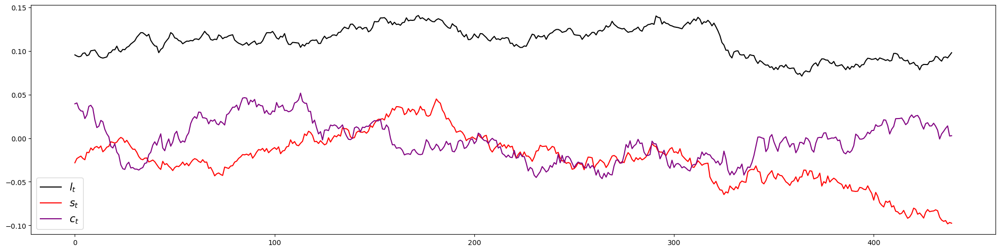

In [51]:
plt.figure(figsize=(25,6))
plt.plot(l_sim, label=r'$l_t$', color="black")
plt.plot(s_sim, label=r'$s_t$', color="red")
plt.plot(c_sim, label=r'$c_t$', color="purple")
plt.legend(prop={'size': 15})

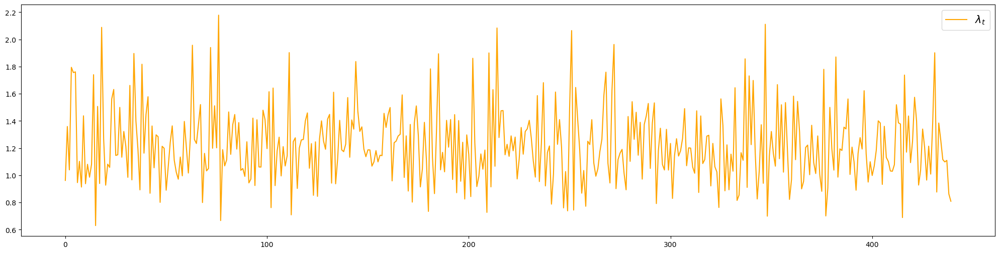

In [52]:
plt.figure(figsize=(25,6))
plt.plot(lamb_sim, label=r'$\lambda_t$', color="orange")
plt.legend(prop={'size': 15})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:569: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0,

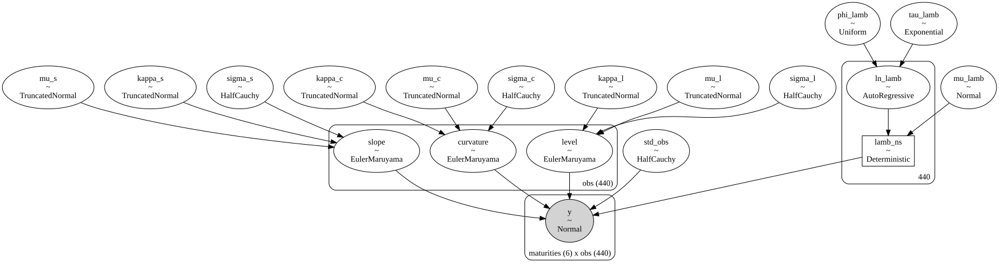

In [53]:
def ou_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma

coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

dt = 1/52

with pm.Model(coords=coords) as dns_dl_sim_model:
        
    phi_lamb = pm.Uniform('phi_lamb', -1, 1)
    tau_lamb = pm.Exponential('tau_lamb', lam = 1)
    ln_lamb = pm.AR('ln_lamb', rho=phi_lamb, tau = tau_lamb, shape=T)
    mu_lamb = pm.Normal('mu_lamb', 0.3, sigma=0.5)
    lamb_ns = pm.Deterministic('lamb_ns', pm.math.exp(ln_lamb) + mu_lamb)

    kappa_l = pm.TruncatedNormal('kappa_l', mu = 1, sigma = 1, lower=0, upper=2/dt)
    mu_l = pm.TruncatedNormal('mu_l', mu = 0.12, sigma=0.05, lower=-0.5)
    sigma_l = pm.HalfCauchy('sigma_l', beta = 0.015)
    kappa_s = pm.TruncatedNormal('kappa_s', mu = 0.8, sigma = 0.5, lower=0, upper=2/dt)
    mu_s = pm.TruncatedNormal('mu_s', mu = -0.04, sigma=0.03, upper=0.5)
    sigma_s = pm.HalfCauchy('sigma_s', beta = 0.015)
    kappa_c = pm.TruncatedNormal('kappa_c', mu = 0.5, sigma = 0.4, lower=0, upper=2/dt)
    mu_c = pm.TruncatedNormal('mu_c', mu = -0.03, sigma=0.04, upper=0.5)
    sigma_c = pm.HalfCauchy('sigma_c', beta = 0.015)

    l = pm.distributions.timeseries.EulerMaruyama("level", dt, ou_coeffs, (kappa_l, mu_l, sigma_l,), dims='obs', shape=T, initval=np.repeat(0.1,T))
    s = pm.distributions.timeseries.EulerMaruyama("slope", dt, ou_coeffs, (kappa_s, mu_s, sigma_s,), dims='obs', shape=T, initval=np.repeat(-0.05,T))
    c = pm.distributions.timeseries.EulerMaruyama("curvature", dt, ou_coeffs, (kappa_c, mu_c, sigma_c,), dims='obs', shape=T, initval=np.repeat(-0.05,T))

    y_mean = lambda tau: l + s*((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) + c*(((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) - pm.math.exp(-lamb_ns*tau))
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.005)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, shape=(len(TTM),T), dims=("maturities",'obs'), observed=Y_sim.T)
    
pm.model_to_graphviz(dns_dl_sim_model)

In [54]:
chains = 2
draws = 2000

with dns_dl_sim_model:
    dns_dl_sim_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.95, chains=chains, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [phi_lamb, tau_lamb, ln_lamb, mu_lamb, kappa_l, mu_l, sigma_l, kappa_s, mu_s, sigma_s, kappa_c, mu_c, sigma_c, level, slope, curvature, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 923 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [55]:
with dns_dl_sim_model:
    dns_dl_sim_ppc = pm.sample_posterior_predictive(trace=dns_dl_sim_trace)
    dns_dl_sim_data = dns_dl_sim_trace

Sampling: [y]


In [120]:
az.summary(dns_dl_sim_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'], hdi_prob=0.99, stat_funcs={"median":np.median})

,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu_lamb,0.209,0.035,0.126,0.306,0.002,0.001,425.0,915.0,1.01,0.209
phi_lamb,-0.159,0.084,-0.371,0.050,0.002,0.002,1471.0,2727.0,1.00,-0.160
tau_lamb,12.267,1.587,8.805,16.750,0.057,0.040,802.0,1715.0,1.00,12.177
kappa_l,0.570,0.359,0.000,1.504,0.009,0.006,1326.0,1632.0,1.00,0.527
mu_l,0.114,0.021,0.049,0.195,0.001,0.000,1862.0,1577.0,1.00,0.112
sigma_l,0.020,0.001,0.018,0.023,0.000,0.000,3263.0,3289.0,1.00,0.020
kappa_s,0.345,0.208,0.000,0.924,0.004,0.003,2569.0,2058.0,1.00,0.318
mu_s,-0.043,0.023,-0.107,0.014,0.000,0.000,5197.0,2916.0,1.00,-0.042
sigma_s,0.029,0.001,0.025,0.032,0.000,0.000,4573.0,3526.0,1.00,0.029
kappa_c,0.730,0.328,0.011,1.522,0.008,0.005,1707.0,1208.0,1.00,0.725


In [121]:
az.summary(dns_dl_sim_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\3117281530.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(dns_dl_sim_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &    mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\nmu\\_lamb  &   0.209 &  0.035 &     0.126 &      0.306 &      0.002 &    0.001 &     425.0 &     915.0 &   1.01 &   0.209 \\\\\nphi\\_lamb &  -0.159 &  0.084 &    -0.371 &      0.050 &      0.002 &    0.002 &    1471.0 &    2727.0 &   1.00 &  -0.160 \\\\\ntau\\_lamb &  12.267 &  1.587 &     8.805 &     16.750 &      0.057 &    0.040 &     802.0 &    1715.0 &   1.00 &  12.177 \\\\\nkappa\\_l  &   0.570 &  0.359 &     0.000 &      1.504 &      0.009 &    0.006 &    1326.0 &    1632.0 &   1.00 &   0.527 \\\\\nmu\\_l     &   0.114 &  0.021 &     0.049 &      0.195 &      0.001 &    0.000 &    1862.0 &    1577.0 &   1.00 &   0.112 \\\\\nsigma\\_l  &   0.020 &  0.001 &     0.018 &      0.023 &      0.000 &    0.000 &    3263.0 &    3289.0 &   1.00 &   0.020 \\\\\nkappa\\_s  &   0.345 &  0.208 &     0.00

array([[<Axes: title={'center': 'mu_lamb'}>,
        <Axes: title={'center': 'mu_lamb'}>],
       [<Axes: title={'center': 'phi_lamb'}>,
        <Axes: title={'center': 'phi_lamb'}>],
       [<Axes: title={'center': 'tau_lamb'}>,
        <Axes: title={'center': 'tau_lamb'}>],
       [<Axes: title={'center': 'kappa_l'}>,
        <Axes: title={'center': 'kappa_l'}>],
       [<Axes: title={'center': 'mu_l'}>,
        <Axes: title={'center': 'mu_l'}>],
       [<Axes: title={'center': 'sigma_l'}>,
        <Axes: title={'center': 'sigma_l'}>],
       [<Axes: title={'center': 'kappa_s'}>,
        <Axes: title={'center': 'kappa_s'}>],
       [<Axes: title={'center': 'mu_s'}>,
        <Axes: title={'center': 'mu_s'}>],
       [<Axes: title={'center': 'sigma_s'}>,
        <Axes: title={'center': 'sigma_s'}>],
       [<Axes: title={'center': 'kappa_c'}>,
        <Axes: title={'center': 'kappa_c'}>],
       [<Axes: title={'center': 'mu_c'}>,
        <Axes: title={'center': 'mu_c'}>],
       [<Axes

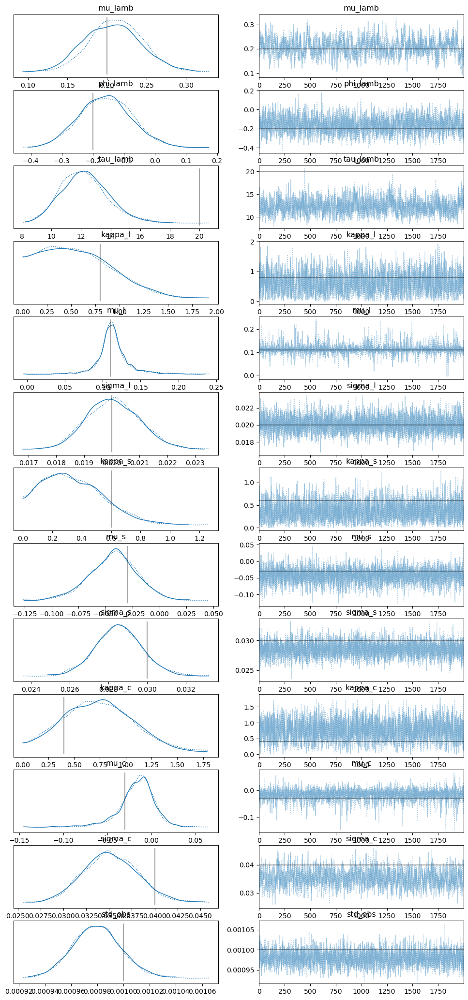

In [58]:
lines= (('kappa_l',{}, [kappa_l_sim]),('mu_l',{},[mu_l_sim]),('sigma_l',{},[sigma_l_sim]),('kappa_s',{}, [kappa_s_sim]),('mu_s',{},[mu_s_sim]),('sigma_s',{},[sigma_s_sim]),('kappa_c',{}, [kappa_c_sim]),('mu_c',{},[mu_c_sim]),('sigma_c',{},[sigma_c_sim]),('mu_lamb',{},[mu_lamb_sim]),('phi_lamb',{},[phi_lamb_sim]),('tau_lamb',{},[tau_lamb_sim]),('std_obs',{},[sigma_obs]))
az.plot_trace(dns_dl_sim_data, var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'],lines=lines)

array([[<Axes: title={'center': 'mu_lamb\n0'}>,
        <Axes: title={'center': 'mu_lamb\n1'}>,
        <Axes: title={'center': 'phi_lamb\n0'}>,
        <Axes: title={'center': 'phi_lamb\n1'}>],
       [<Axes: title={'center': 'tau_lamb\n0'}>,
        <Axes: title={'center': 'tau_lamb\n1'}>,
        <Axes: title={'center': 'kappa_l\n0'}>,
        <Axes: title={'center': 'kappa_l\n1'}>],
       [<Axes: title={'center': 'mu_l\n0'}>,
        <Axes: title={'center': 'mu_l\n1'}>,
        <Axes: title={'center': 'sigma_l\n0'}>,
        <Axes: title={'center': 'sigma_l\n1'}>],
       [<Axes: title={'center': 'kappa_s\n0'}>,
        <Axes: title={'center': 'kappa_s\n1'}>,
        <Axes: title={'center': 'mu_s\n0'}>,
        <Axes: title={'center': 'mu_s\n1'}>],
       [<Axes: title={'center': 'sigma_s\n0'}>,
        <Axes: title={'center': 'sigma_s\n1'}>,
        <Axes: title={'center': 'kappa_c\n0'}>,
        <Axes: title={'center': 'kappa_c\n1'}>],
       [<Axes: title={'center': 'mu_c\n0'}>

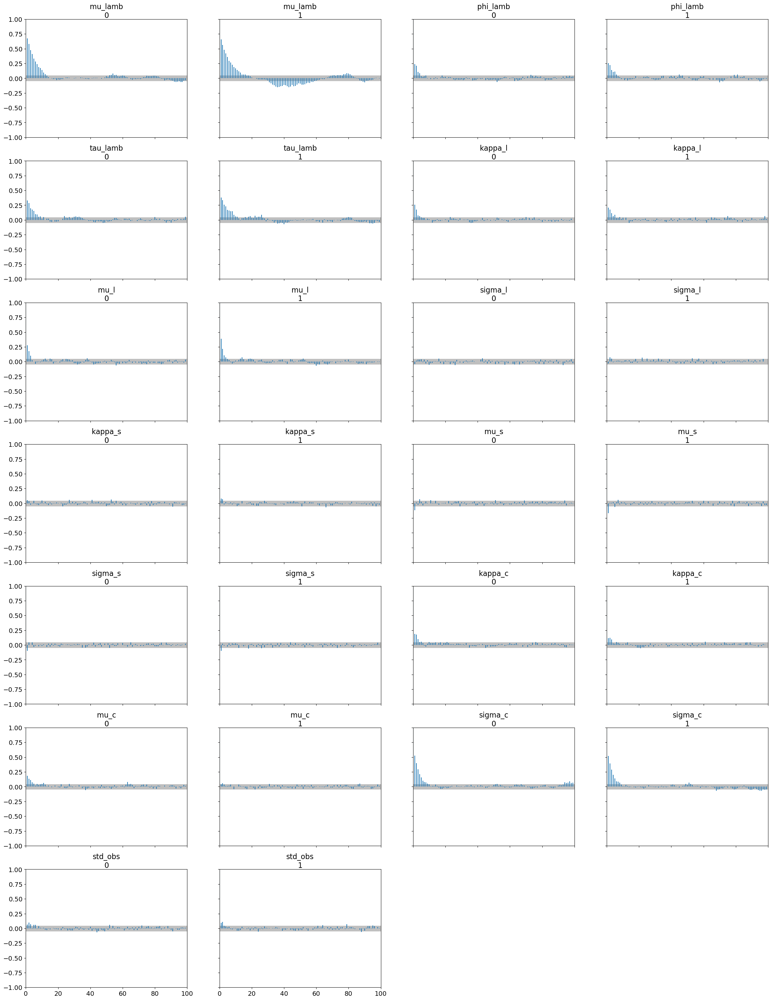

In [59]:
az.plot_autocorr(dns_dl_sim_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'])

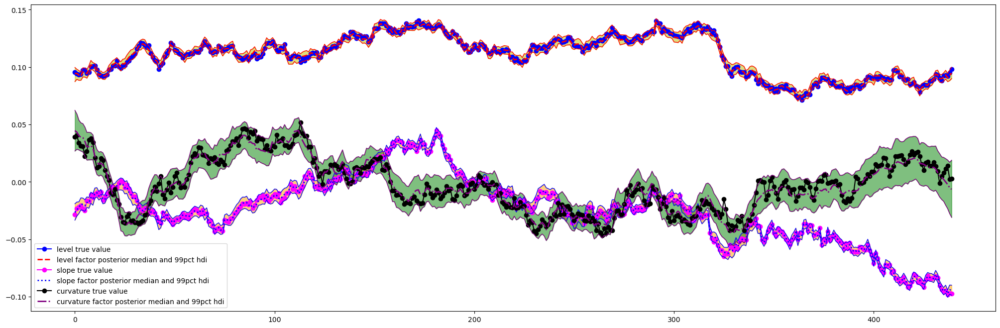

In [60]:
posterior_median_l = np.array(np.median(dns_dl_sim_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_dl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_dl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_dl_sim_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_dl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_dl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_dl_sim_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_dl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_dl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(l_sim, label='level true value',marker="o", color='blue')
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(s_sim, label='slope true value',marker="o", color='magenta')
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(c_sim, label='curvature true value',marker="o", color='black')
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

In [61]:
tl = 0
for i in range(len(l_sim)):
    if (posterior_hpd_lower_l[i] < l_sim[i] < posterior_hpd_upper_l[i]):
        tl += 1
print(tl)

ts = 0
for i in range(len(s_sim)):
    if (posterior_hpd_lower_s[i] < s_sim[i] < posterior_hpd_upper_s[i]):
        ts += 1
print(ts)

tc = 0
for i in range(len(c_sim)):
    if (posterior_hpd_lower_c[i] < c_sim[i] < posterior_hpd_upper_c[i]):
        tc += 1
print(tc)

435
437
430


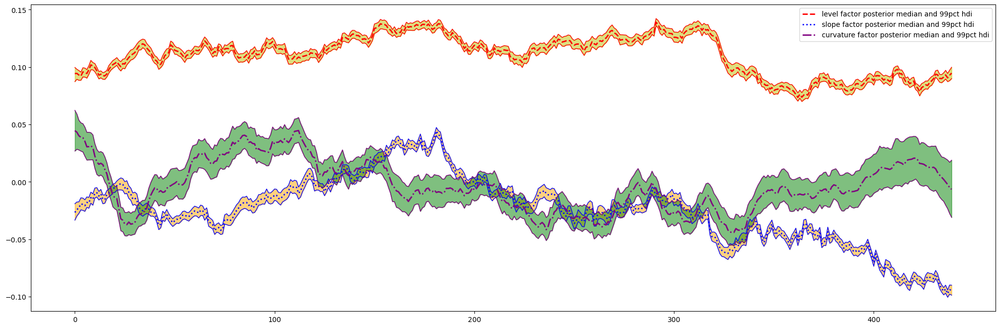

In [62]:
posterior_median_l = np.array(np.median(dns_dl_sim_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_dl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_dl_sim_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_dl_sim_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_dl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_dl_sim_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_dl_sim_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_dl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_dl_sim_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

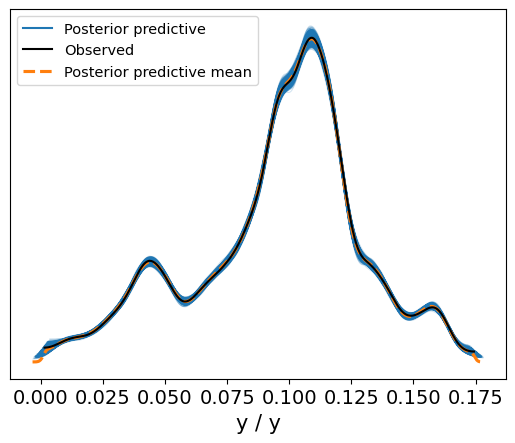

In [63]:
az.plot_ppc(dns_dl_sim_ppc)

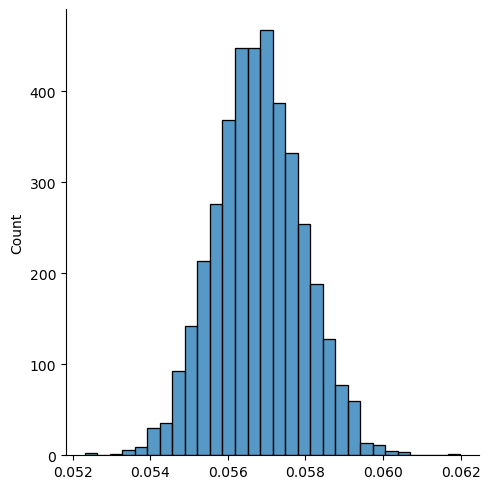

In [64]:
rmse_post_draws_dns = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_dns.append(np.sum(np.sqrt((dns_dl_sim_ppc.posterior_predictive['y'][i][j].T - Y_sim)**2/(len(TTM)*T))))
rmse_post_draws_dns = np.array(rmse_post_draws_dns)
sns.displot(rmse_post_draws_dns, bins=30)

Dados reais

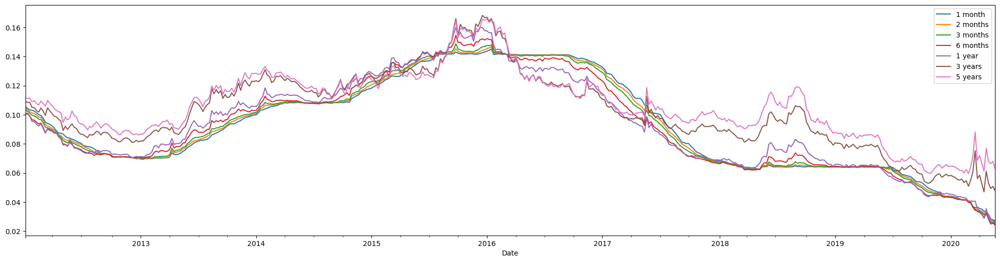

In [139]:
spot_br = pd.read_excel('http://nefin.com.br/resources/spot_rate_curve/spot_rate_curve.xls').set_index('Date').interpolate(method='linear')
spot_br['2012-01-01':].asfreq("W",method='bfill').plot(figsize=(25,6))
spot_br_obs = spot_br['2012-01-01':].drop(['1 month'],axis=1).asfreq("W",method="bfill").values
T = len(spot_br_obs)

In [142]:
spot_br['2012-01-01':].asfreq("W",method='bfill')

,1 month,2 months,3 months,6 months,1 year,3 years,5 years
Date,,,,,,,
2012-01-08,0.105550,0.104324,0.103066,0.101077,0.100521,0.109238,0.111517
2012-01-15,0.104323,0.103302,0.102320,0.100880,0.100397,0.108379,0.111179
2012-01-22,0.103300,0.102061,0.100911,0.099189,0.098944,0.108483,0.111420
2012-01-29,0.103100,0.101292,0.099700,0.096496,0.095383,0.104909,0.108891
2012-02-05,0.102478,0.100729,0.099225,0.096254,0.095246,0.105030,0.109564
...,...,...,...,...,...,...,...
2020-04-26,0.033248,0.032829,0.032293,0.032242,0.035352,0.061200,0.076869
2020-05-03,0.031607,0.030246,0.029377,0.028310,0.029642,0.053161,0.067745
2020-05-10,0.028374,0.027131,0.026007,0.024916,0.026498,0.049333,0.066324


C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(


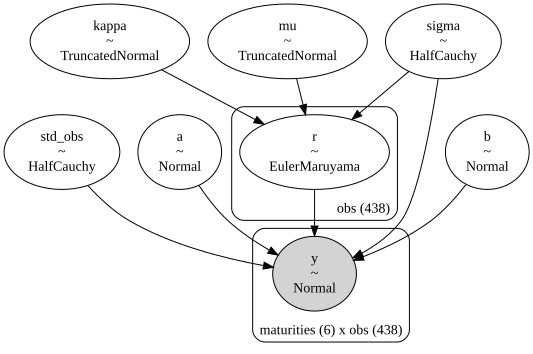

In [66]:
def vasicek_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma

def B(beta,tau):
    return (1 - pm.math.exp(-beta * tau))/beta

def A(beta,alpha,sigma,tau):
    return ((sigma**2/(2*pm.math.sqr(beta))) - alpha)*tau + (B(beta,tau)*(alpha - pm.math.sqr(sigma/beta))) + pm.math.sqr(sigma/(2*beta))*(1-pm.math.exp(-2*beta*tau))/beta

dt = 1/52

coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

with pm.Model(coords=coords) as vasicek_br_model:

    kappa = pm.TruncatedNormal('kappa', mu = 0.7, sigma = 0.4, lower=0, upper=2/dt)
    mu = pm.TruncatedNormal('mu', mu = 0.08, sigma=0.1, lower=0)
    sigma = pm.HalfCauchy('sigma', beta = 0.03)
    a = pm.Normal('a', mu = 0.1, sigma = 0.1)
    b = pm.Normal('b', mu = 0.5, sigma = 0.5)
    
    r = pm.distributions.timeseries.EulerMaruyama("r", dt, vasicek_coeffs, (kappa, mu, sigma,), shape=T, dims="obs", initval=np.repeat(0.04,T))

    y_mean = lambda tau: -(A(b,a,sigma,tau) - (B(b,tau)*r))/tau
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.008)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, shape=(len(TTM),T), dims=('maturities','obs'), observed=spot_br_obs.T)
    
pm.model_to_graphviz(vasicek_br_model)

In [67]:
chains = 2
draws = 2000

with vasicek_br_model:
    vasicek_br_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.9, chains=chains, return_inferencedata=True, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [kappa, mu, sigma, a, b, r, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 94 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [68]:
with vasicek_br_model:
    vasicek_br_ppc = pm.sample_posterior_predictive(trace=vasicek_br_trace)
    vasicek_br_data = vasicek_br_trace

Sampling: [y]


In [122]:
az.summary(vasicek_br_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
a,0.137,0.001,0.133,0.141,0.000,0.000,3339.0,3205.0,1.0,0.137
b,0.181,0.006,0.166,0.197,0.000,0.000,3113.0,3254.0,1.0,0.181
kappa,0.084,0.056,0.000,0.247,0.001,0.001,1835.0,1398.0,1.0,0.078
mu,0.047,0.041,0.000,0.204,0.001,0.001,2452.0,1934.0,1.0,0.038
sigma,0.012,0.001,0.010,0.014,0.000,0.000,1156.0,1837.0,1.0,0.012
std_obs,0.006,0.000,0.006,0.006,0.000,0.000,5951.0,3127.0,1.0,0.006


In [123]:
az.summary(vasicek_br_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(
C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\574906620.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(vasicek_br_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &   mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\na       &  0.137 &  0.001 &     0.133 &      0.141 &      0.000 &    0.000 &    3339.0 &    3205.0 &    1.0 &   0.137 \\\\\nb       &  0.181 &  0.006 &     0.166 &      0.197 &      0.000 &    0.000 &    3113.0 &    3254.0 &    1.0 &   0.181 \\\\\nkappa   &  0.084 &  0.056 &     0.000 &      0.247 &      0.001 &    0.001 &    1835.0 &    1398.0 &    1.0 &   0.078 \\\\\nmu      &  0.047 &  0.041 &     0.000 &      0.204 &      0.001 &    0.001 &    2452.0 &    1934.0 &    1.0 &   0.038 \\\\\nsigma   &  0.012 &  0.001 &     0.010 &      0.014 &      0.000 &    0.000 &    1156.0 &    1837.0 &    1.0 &   0.012 \\\\\nstd\\_obs &  0.006 &  0.000 &     0.006 &      0.006 &      0.000 &    0.000 &    5951.0 &    3127.0 &    1.0 &   0.006 \\\\\n\\bottomrule\n\\end{tabular}\n'

array([[<Axes: title={'center': 'a'}>, <Axes: title={'center': 'a'}>],
       [<Axes: title={'center': 'b'}>, <Axes: title={'center': 'b'}>],
       [<Axes: title={'center': 'kappa'}>,
        <Axes: title={'center': 'kappa'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'std_obs'}>,
        <Axes: title={'center': 'std_obs'}>]], dtype=object)

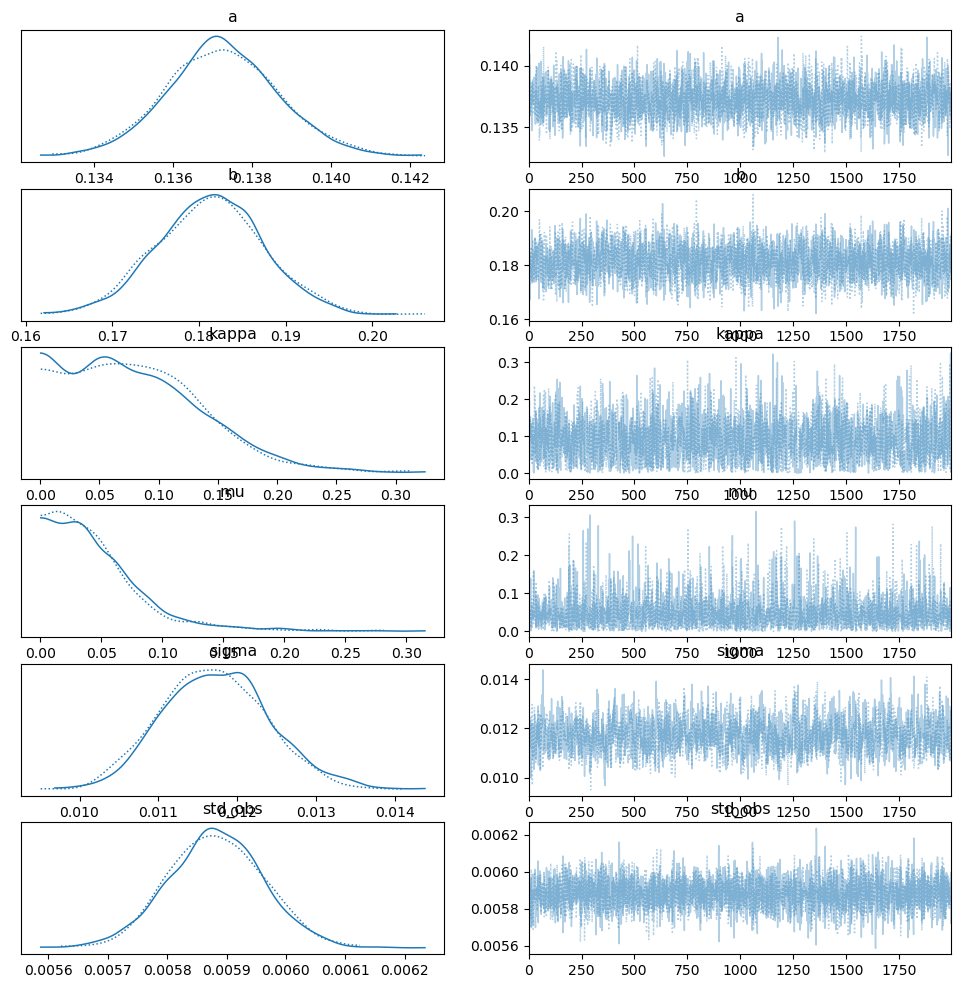

In [71]:
az.plot_trace(vasicek_br_data, var_names=['a','b','kappa','mu','sigma','std_obs'])

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


array([[<Axes: title={'center': 'a\n0'}>,
        <Axes: title={'center': 'a\n1'}>,
        <Axes: title={'center': 'b\n0'}>],
       [<Axes: title={'center': 'b\n1'}>,
        <Axes: title={'center': 'kappa\n0'}>,
        <Axes: title={'center': 'kappa\n1'}>],
       [<Axes: title={'center': 'mu\n0'}>,
        <Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'sigma\n0'}>],
       [<Axes: title={'center': 'sigma\n1'}>,
        <Axes: title={'center': 'std_obs\n0'}>,
        <Axes: title={'center': 'std_obs\n1'}>]], dtype=object)

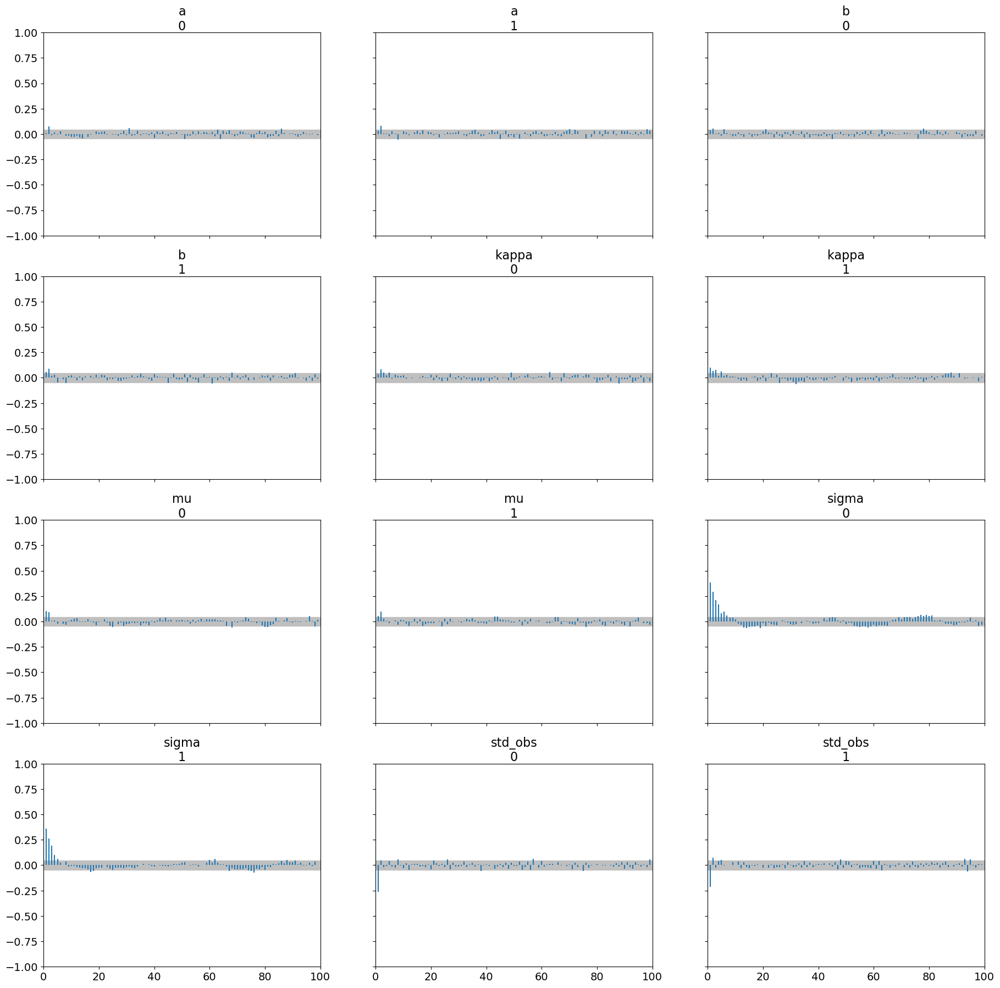

In [72]:
az.plot_autocorr(vasicek_br_data,var_names=['~r','~P'])

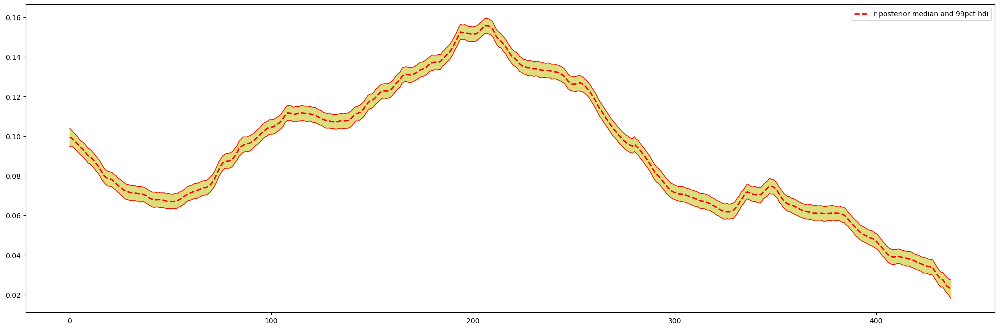

In [73]:
posterior_median = np.array(np.median(vasicek_br_trace.posterior['r'].to_numpy(),axis=(0,1)))

posterior_hpd_lower = az.hdi(vasicek_br_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[0]

posterior_hpd_upper = az.hdi(vasicek_br_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median, 'r', lw=2, label="r posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper, "r", lw=1)
plt.plot(posterior_hpd_lower, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower, posterior_hpd_upper, color="y", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

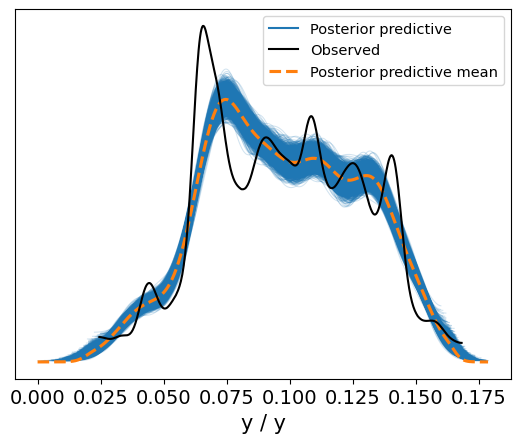

In [74]:
az.plot_ppc(vasicek_br_ppc)

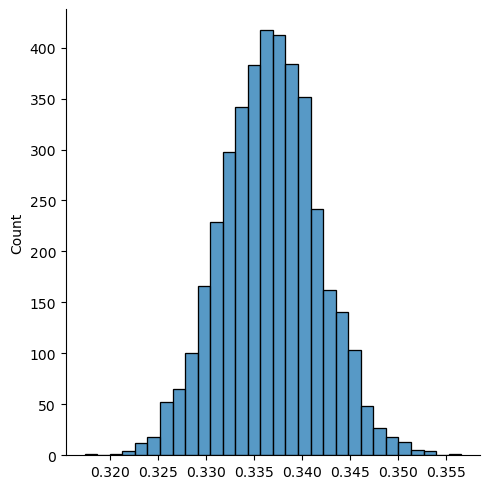

In [75]:
rmse_post_draws_vasicek = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_vasicek.append(np.sum(np.sqrt((vasicek_br_ppc.posterior_predictive['y'][i][j].T - spot_br_obs)**2/(len(TTM)*T))))
rmse_post_draws_vasicek = np.array(rmse_post_draws_vasicek)
sns.displot(rmse_post_draws_vasicek, bins=30)

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(


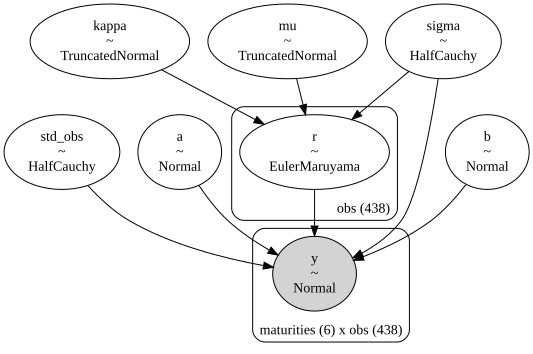

In [76]:
def CIR_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma*pm.math.sqrt(pm.math.abs(x))

def gamma(beta, sigma):
    return pm.math.sqrt(pm.math.sqr(beta) + 2*pm.math.sqr(sigma))

def g(beta,sigma,tau):
    return 2*gamma(beta,sigma) + (beta + gamma(beta,sigma)) * (pm.math.exp(gamma(beta,sigma)*tau)-1)

def B(beta,sigma,tau):
    return 2*(pm.math.exp(gamma(beta,sigma)*tau)-1)/g(beta,sigma,tau)

def A(beta,alpha,sigma,tau):
    return (2*beta*alpha/pm.math.sqr(sigma)) * pm.math.log(2*gamma(beta,sigma)*pm.math.exp((beta+gamma(beta,sigma))*tau/2)/g(beta,sigma,tau))

dt = 1/52

coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

with pm.Model(coords=coords) as CIR_br_model:

    kappa = pm.TruncatedNormal('kappa', mu = 0.7, sigma = 0.4, lower=0, upper=2/dt)
    sigma = pm.HalfCauchy('sigma', beta = 0.1)
    mu = pm.TruncatedNormal('mu', mu = 0.08, sigma=0.1, lower=0)
    a = pm.Normal('a', mu = 0.1, sigma = 0.1)
    b = pm.Normal('b', mu = 0.5, sigma = 1)

    r = pm.distributions.timeseries.EulerMaruyama("r", dt, CIR_coeffs, (kappa, mu, sigma,), shape=T, dims="obs", initval=np.repeat(0.04,T))

    y_mean = lambda tau: -(A(b,a,sigma,tau) - B(b,sigma,tau)*r)/tau
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.008)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, dims=('maturities','obs'), shape=(len(TTM),T), observed=spot_br_obs.T)
    
pm.model_to_graphviz(CIR_br_model)

In [77]:
chains = 2
draws = 2000

with CIR_br_model:
    CIR_br_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.9, chains=chains, return_inferencedata=True, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [kappa, sigma, mu, a, b, r, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 132 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [78]:
with CIR_br_model:
    CIR_br_ppc = pm.sample_posterior_predictive(trace=CIR_br_trace)
    CIR_br_data = CIR_br_trace

Sampling: [y]


In [124]:
az.summary(CIR_br_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median})

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
a,0.138,0.001,0.134,0.142,0.000,0.000,4523.0,3349.0,1.0,0.138
b,0.179,0.006,0.163,0.195,0.000,0.000,4165.0,3256.0,1.0,0.179
kappa,0.107,0.059,0.000,0.262,0.001,0.001,1808.0,1797.0,1.0,0.105
sigma,0.040,0.002,0.034,0.046,0.000,0.000,989.0,2138.0,1.0,0.040
mu,0.028,0.029,0.000,0.143,0.001,0.000,2549.0,1676.0,1.0,0.021
std_obs,0.006,0.000,0.006,0.006,0.000,0.000,4729.0,2668.0,1.0,0.006


In [125]:
az.summary(CIR_br_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(
C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\2795660039.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(CIR_br_data,var_names=['~r','~P'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &   mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\na       &  0.138 &  0.001 &     0.134 &      0.142 &      0.000 &    0.000 &    4523.0 &    3349.0 &    1.0 &   0.138 \\\\\nb       &  0.179 &  0.006 &     0.163 &      0.195 &      0.000 &    0.000 &    4165.0 &    3256.0 &    1.0 &   0.179 \\\\\nkappa   &  0.107 &  0.059 &     0.000 &      0.262 &      0.001 &    0.001 &    1808.0 &    1797.0 &    1.0 &   0.105 \\\\\nsigma   &  0.040 &  0.002 &     0.034 &      0.046 &      0.000 &    0.000 &     989.0 &    2138.0 &    1.0 &   0.040 \\\\\nmu      &  0.028 &  0.029 &     0.000 &      0.143 &      0.001 &    0.000 &    2549.0 &    1676.0 &    1.0 &   0.021 \\\\\nstd\\_obs &  0.006 &  0.000 &     0.006 &      0.006 &      0.000 &    0.000 &    4729.0 &    2668.0 &    1.0 &   0.006 \\\\\n\\bottomrule\n\\end{tabular}\n'

array([[<Axes: title={'center': 'a'}>, <Axes: title={'center': 'a'}>],
       [<Axes: title={'center': 'b'}>, <Axes: title={'center': 'b'}>],
       [<Axes: title={'center': 'kappa'}>,
        <Axes: title={'center': 'kappa'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'std_obs'}>,
        <Axes: title={'center': 'std_obs'}>]], dtype=object)

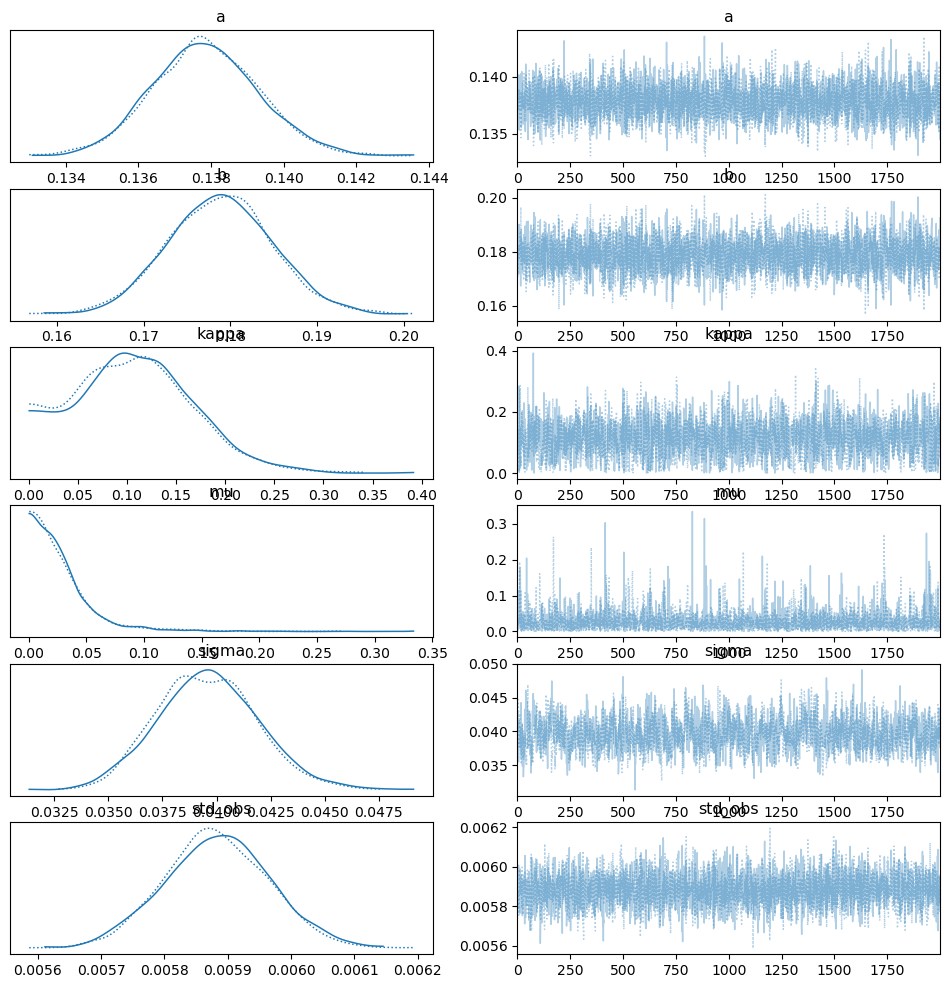

In [81]:
az.plot_trace(CIR_br_data, var_names=['a','b','kappa','mu','sigma','std_obs'])

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\utils.py:134: UserWarning: Items starting with ~: ['P'] have not been found and will be ignored
  warnings.warn(


array([[<Axes: title={'center': 'a\n0'}>,
        <Axes: title={'center': 'a\n1'}>,
        <Axes: title={'center': 'b\n0'}>],
       [<Axes: title={'center': 'b\n1'}>,
        <Axes: title={'center': 'kappa\n0'}>,
        <Axes: title={'center': 'kappa\n1'}>],
       [<Axes: title={'center': 'sigma\n0'}>,
        <Axes: title={'center': 'sigma\n1'}>,
        <Axes: title={'center': 'mu\n0'}>],
       [<Axes: title={'center': 'mu\n1'}>,
        <Axes: title={'center': 'std_obs\n0'}>,
        <Axes: title={'center': 'std_obs\n1'}>]], dtype=object)

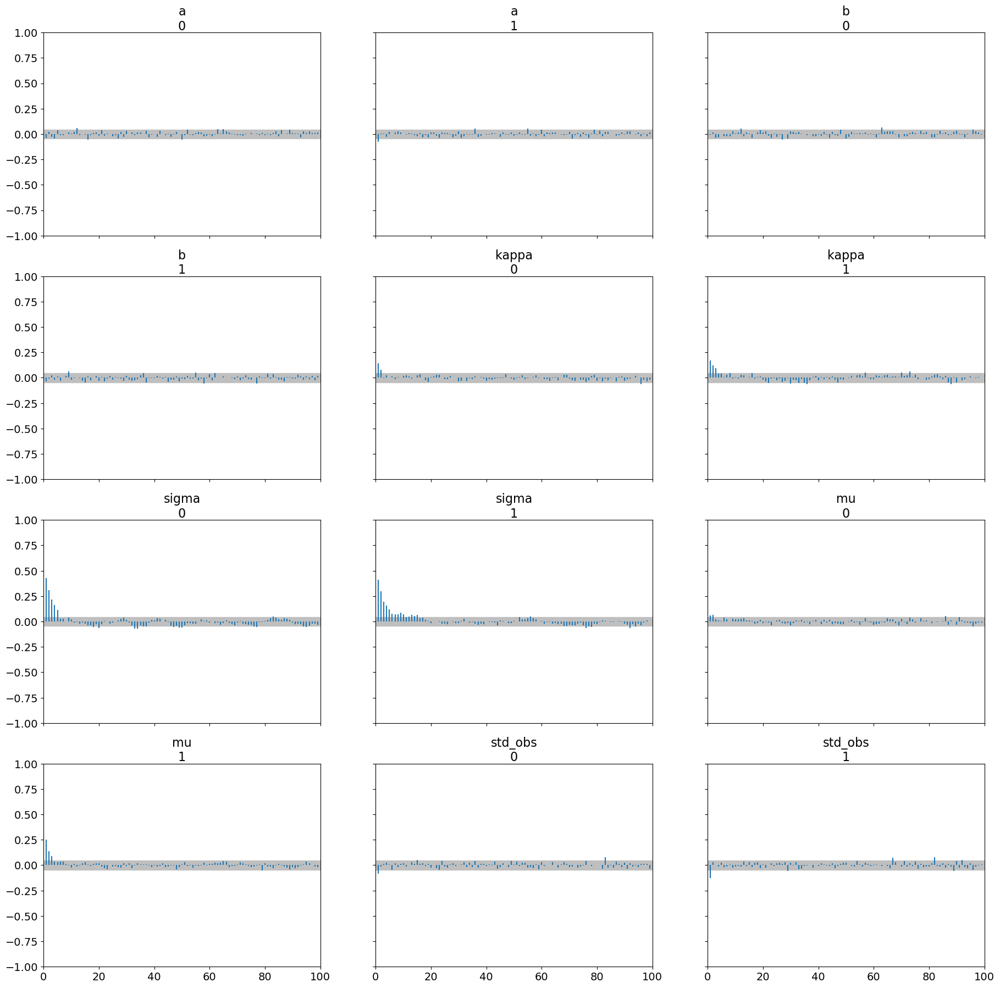

In [82]:
az.plot_autocorr(CIR_br_data,var_names=['~r','~P'])

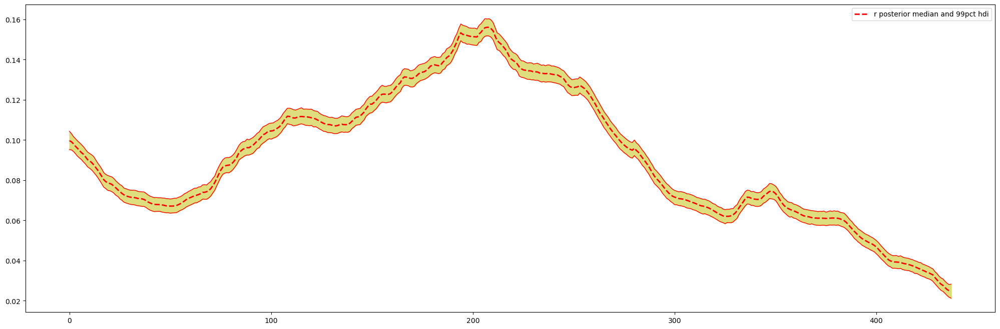

In [83]:
posterior_median = np.array(np.median(CIR_br_trace.posterior['r'].to_numpy(),axis=(0,1)))

posterior_hpd_lower = az.hdi(CIR_br_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[0]

posterior_hpd_upper = az.hdi(CIR_br_trace.posterior['r'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median, 'r', lw=2, label="r posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper, "r", lw=1)
plt.plot(posterior_hpd_lower, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower, posterior_hpd_upper, color="y", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

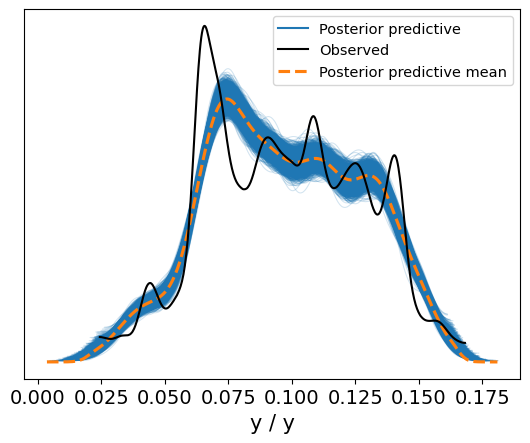

In [84]:
az.plot_ppc(CIR_br_ppc)

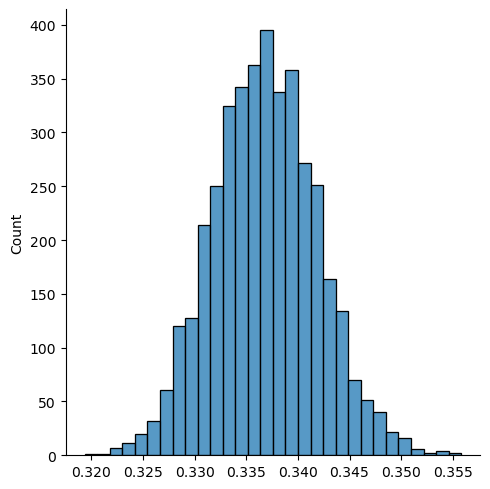

In [85]:
rmse_post_draws_CIR = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_CIR.append(np.sum(np.sqrt((CIR_br_ppc.posterior_predictive['y'][i][j].T - spot_br_obs)**2/(len(TTM)*T))))
rmse_post_draws_CIR = np.array(rmse_post_draws_CIR)
sns.displot(rmse_post_draws_CIR, bins=30)

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(


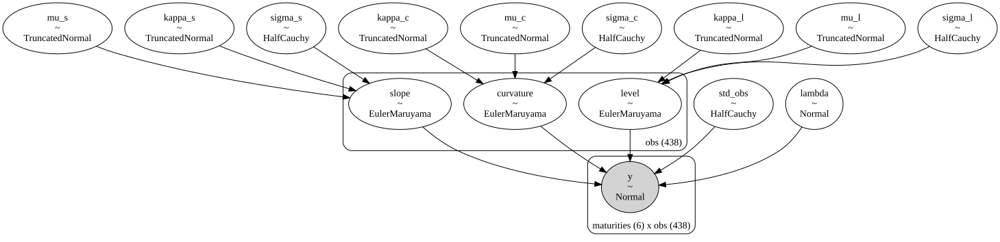

In [86]:
def ou_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma

dt = 1/52

coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

with pm.Model(coords=coords) as dns_sl_br_model:

    kappa_l = pm.TruncatedNormal('kappa_l', mu = 1, sigma = 1, lower=0, upper=2/dt)
    mu_l = pm.TruncatedNormal('mu_l', mu = 0.12, sigma=0.05, lower=-0.5)
    sigma_l = pm.HalfCauchy('sigma_l', beta = 0.015)
    kappa_s = pm.TruncatedNormal('kappa_s', mu = 0.8, sigma = 0.5, lower=0, upper=2/dt)
    mu_s = pm.TruncatedNormal('mu_s', mu = -0.04, sigma=0.03, upper=0.5)
    sigma_s = pm.HalfCauchy('sigma_s', beta = 0.015)
    kappa_c = pm.TruncatedNormal('kappa_c', mu = 0.5, sigma = 0.4, lower=0, upper=2/dt)
    mu_c = pm.TruncatedNormal('mu_c', mu = -0.03, sigma=0.04, upper=0.5)
    sigma_c = pm.HalfCauchy('sigma_c', beta = 0.015)
    
    lamb_ns = pm.Normal('lambda', mu = 1.1, sigma = 0.3)

    l = pm.distributions.timeseries.EulerMaruyama("level", dt, ou_coeffs, (kappa_l, mu_l, sigma_l,), dims='obs', shape=T, initval=np.repeat(0.1,T))
    s = pm.distributions.timeseries.EulerMaruyama("slope", dt, ou_coeffs, (kappa_s, mu_s, sigma_s,), dims='obs', shape=T, initval=np.repeat(-0.05,T))
    c = pm.distributions.timeseries.EulerMaruyama("curvature", dt, ou_coeffs, (kappa_c, mu_c, sigma_c,), dims='obs', shape=T, initval=np.repeat(-0.05,T))

    y_mean = lambda tau: l + s*((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) + c*(((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) - pm.math.exp(-lamb_ns*tau))
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.005)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, shape=(len(TTM),T), dims=("maturities","obs"), observed=spot_br_obs.T)
    
pm.model_to_graphviz(dns_sl_br_model)

In [87]:
chains = 2
draws = 2000

with dns_sl_br_model:
    dns_sl_br_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.95, chains=chains, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [kappa_l, mu_l, sigma_l, kappa_s, mu_s, sigma_s, kappa_c, mu_c, sigma_c, lambda, level, slope, curvature, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 325 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [88]:
with dns_sl_br_model:
    dns_sl_br_ppc = pm.sample_posterior_predictive(trace=dns_sl_br_trace)
    dns_sl_br_data = dns_sl_br_trace

Sampling: [y]


In [126]:
az.summary(dns_sl_br_data,var_names=['~level','~slope','~curvature'], hdi_prob=0.99, stat_funcs={"median":np.median})

,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
lambda,1.396,0.014,1.360,1.432,0.001,0.000,381.0,665.0,1.0,1.396
kappa_l,0.590,0.371,0.000,1.572,0.008,0.006,1684.0,1735.0,1.0,0.547
mu_l,0.109,0.023,0.031,0.191,0.000,0.000,2648.0,2114.0,1.0,0.109
sigma_l,0.025,0.001,0.023,0.028,0.000,0.000,5475.0,3363.0,1.0,0.025
kappa_s,0.540,0.288,0.001,1.276,0.006,0.004,2331.0,1662.0,1.0,0.524
mu_s,-0.033,0.019,-0.097,0.019,0.000,0.000,5084.0,2780.0,1.0,-0.031
sigma_s,0.027,0.001,0.025,0.030,0.000,0.000,4849.0,3303.0,1.0,0.027
kappa_c,0.330,0.204,0.000,0.878,0.004,0.003,2316.0,2258.0,1.0,0.305
mu_c,-0.041,0.030,-0.122,0.049,0.000,0.000,5453.0,2336.0,1.0,-0.041
sigma_c,0.034,0.002,0.030,0.039,0.000,0.000,2108.0,2878.0,1.0,0.034


In [127]:
az.summary(dns_sl_br_data,var_names=['~level','~slope','~curvature'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\3600095345.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(dns_sl_br_data,var_names=['~level','~slope','~curvature'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &   mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\nlambda  &  1.396 &  0.014 &     1.360 &      1.432 &      0.001 &    0.000 &     381.0 &     665.0 &    1.0 &   1.396 \\\\\nkappa\\_l &  0.590 &  0.371 &     0.000 &      1.572 &      0.008 &    0.006 &    1684.0 &    1735.0 &    1.0 &   0.547 \\\\\nmu\\_l    &  0.109 &  0.023 &     0.031 &      0.191 &      0.000 &    0.000 &    2648.0 &    2114.0 &    1.0 &   0.109 \\\\\nsigma\\_l &  0.025 &  0.001 &     0.023 &      0.028 &      0.000 &    0.000 &    5475.0 &    3363.0 &    1.0 &   0.025 \\\\\nkappa\\_s &  0.540 &  0.288 &     0.001 &      1.276 &      0.006 &    0.004 &    2331.0 &    1662.0 &    1.0 &   0.524 \\\\\nmu\\_s    & -0.033 &  0.019 &    -0.097 &      0.019 &      0.000 &    0.000 &    5084.0 &    2780.0 &    1.0 &  -0.031 \\\\\nsigma\\_s &  0.027 &  0.001 &     0.025 &      0.030 & 

array([[<Axes: title={'center': 'lambda'}>,
        <Axes: title={'center': 'lambda'}>],
       [<Axes: title={'center': 'kappa_l'}>,
        <Axes: title={'center': 'kappa_l'}>],
       [<Axes: title={'center': 'mu_l'}>,
        <Axes: title={'center': 'mu_l'}>],
       [<Axes: title={'center': 'sigma_l'}>,
        <Axes: title={'center': 'sigma_l'}>],
       [<Axes: title={'center': 'kappa_s'}>,
        <Axes: title={'center': 'kappa_s'}>],
       [<Axes: title={'center': 'mu_s'}>,
        <Axes: title={'center': 'mu_s'}>],
       [<Axes: title={'center': 'sigma_s'}>,
        <Axes: title={'center': 'sigma_s'}>],
       [<Axes: title={'center': 'kappa_c'}>,
        <Axes: title={'center': 'kappa_c'}>],
       [<Axes: title={'center': 'mu_c'}>,
        <Axes: title={'center': 'mu_c'}>],
       [<Axes: title={'center': 'sigma_c'}>,
        <Axes: title={'center': 'sigma_c'}>],
       [<Axes: title={'center': 'std_obs'}>,
        <Axes: title={'center': 'std_obs'}>]], dtype=object)

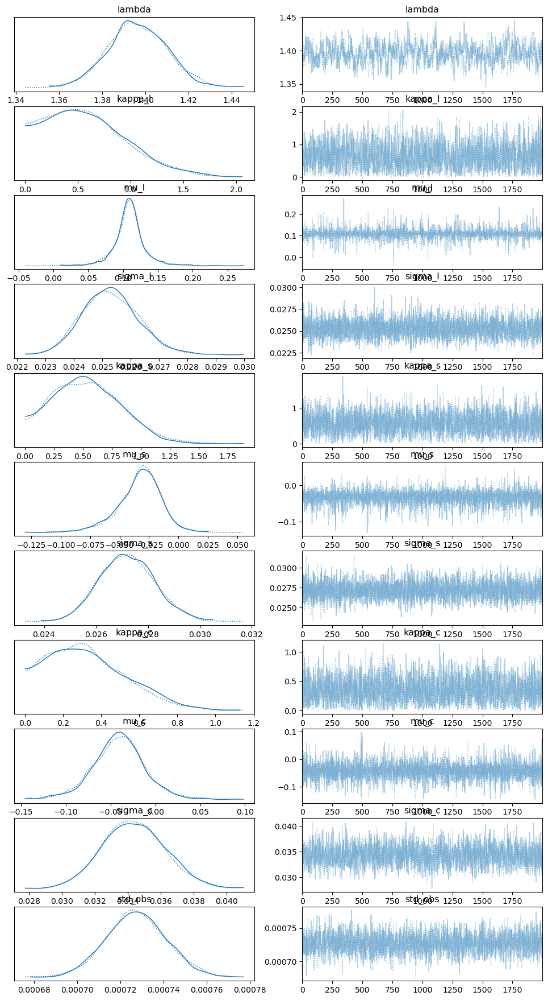

In [91]:
az.plot_trace(dns_sl_br_data, var_names=['~level','~slope','~curvature'])

array([[<Axes: title={'center': 'lambda\n0'}>,
        <Axes: title={'center': 'lambda\n1'}>,
        <Axes: title={'center': 'kappa_l\n0'}>,
        <Axes: title={'center': 'kappa_l\n1'}>],
       [<Axes: title={'center': 'mu_l\n0'}>,
        <Axes: title={'center': 'mu_l\n1'}>,
        <Axes: title={'center': 'sigma_l\n0'}>,
        <Axes: title={'center': 'sigma_l\n1'}>],
       [<Axes: title={'center': 'kappa_s\n0'}>,
        <Axes: title={'center': 'kappa_s\n1'}>,
        <Axes: title={'center': 'mu_s\n0'}>,
        <Axes: title={'center': 'mu_s\n1'}>],
       [<Axes: title={'center': 'sigma_s\n0'}>,
        <Axes: title={'center': 'sigma_s\n1'}>,
        <Axes: title={'center': 'kappa_c\n0'}>,
        <Axes: title={'center': 'kappa_c\n1'}>],
       [<Axes: title={'center': 'mu_c\n0'}>,
        <Axes: title={'center': 'mu_c\n1'}>,
        <Axes: title={'center': 'sigma_c\n0'}>,
        <Axes: title={'center': 'sigma_c\n1'}>],
       [<Axes: title={'center': 'std_obs\n0'}>,
       

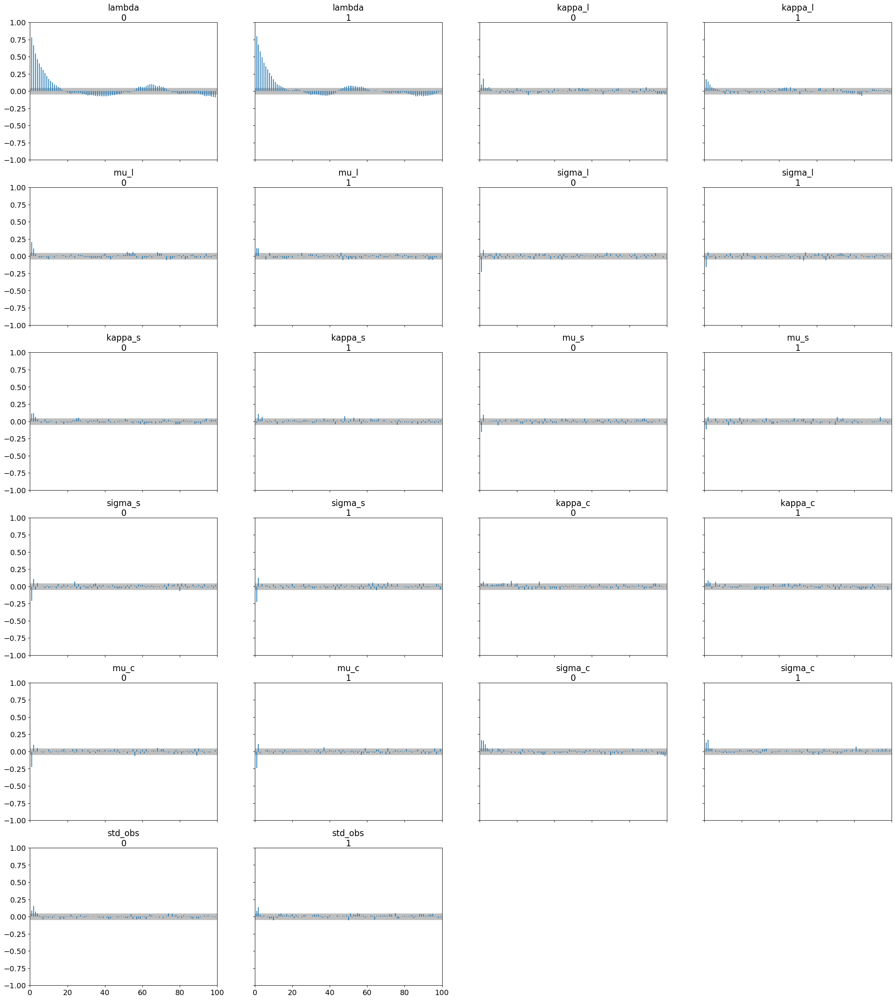

In [92]:
az.plot_autocorr(dns_sl_br_data,var_names=['~level','~slope','~curvature'])

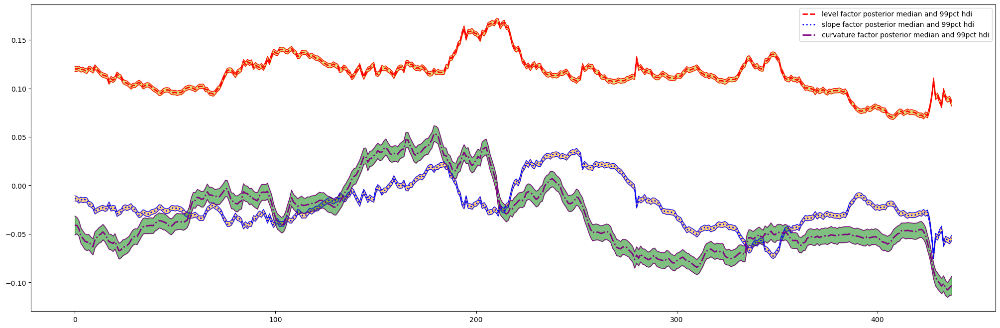

In [93]:
posterior_median_l = np.array(np.median(dns_sl_br_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_sl_br_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_sl_br_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_sl_br_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_sl_br_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_sl_br_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_sl_br_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_sl_br_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_sl_br_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

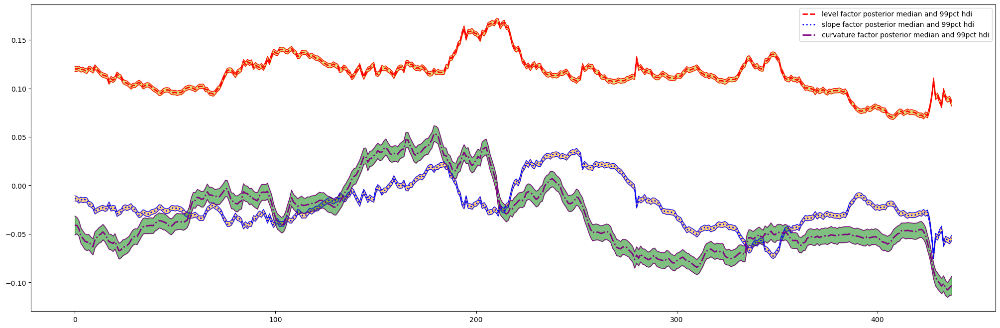

In [94]:
posterior_median_l = np.array(np.median(dns_sl_br_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_sl_br_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_sl_br_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_sl_br_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_sl_br_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_sl_br_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_sl_br_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_sl_br_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_sl_br_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

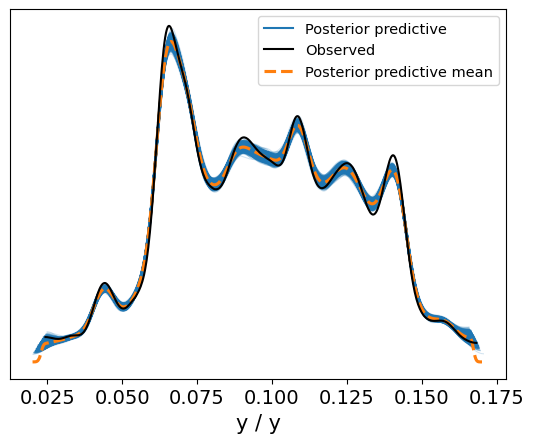

In [95]:
az.plot_ppc(dns_sl_br_ppc)

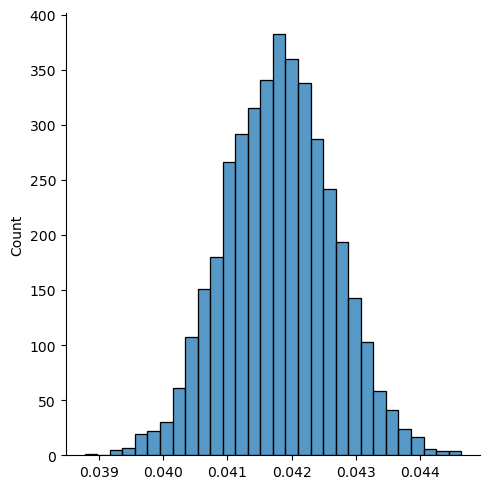

In [96]:
rmse_post_draws_dns = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_dns.append(np.sum(np.sqrt((dns_sl_br_ppc.posterior_predictive['y'][i][j].T - spot_br_obs)**2/(len(TTM)*T))))
rmse_post_draws_dns = np.array(rmse_post_draws_dns)
sns.displot(rmse_post_draws_dns, bins=30)

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:569: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\pymc\distributions\timeseries.py:973: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0,

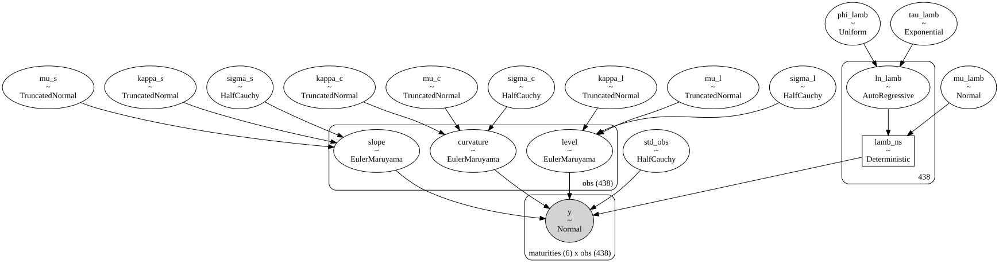

In [97]:
def ou_coeffs(x, kappa, mu, sigma):
    return kappa*(mu-x), sigma

coords={"maturities": np.array([1/6,1/4,1/2,1,3,5]), "obs" : np.arange(0,T)}

dt = 1/52

with pm.Model(coords=coords) as dns_dl_br_model:
        
    phi_lamb = pm.Uniform('phi_lamb', -1, 1)
    tau_lamb = pm.Exponential('tau_lamb', lam = 1)
    ln_lamb = pm.AR('ln_lamb', rho=phi_lamb, tau = tau_lamb, shape=T)
    mu_lamb = pm.Normal('mu_lamb', 0.3, sigma=0.5)
    lamb_ns = pm.Deterministic('lamb_ns', pm.math.exp(ln_lamb) + mu_lamb)

    kappa_l = pm.TruncatedNormal('kappa_l', mu = 1, sigma = 1, lower=0, upper=2/dt)
    mu_l = pm.TruncatedNormal('mu_l', mu = 0.12, sigma=0.05, lower=-0.5)
    sigma_l = pm.HalfCauchy('sigma_l', beta = 0.015)
    kappa_s = pm.TruncatedNormal('kappa_s', mu = 0.8, sigma = 0.5, lower=0, upper=2/dt)
    mu_s = pm.TruncatedNormal('mu_s', mu = -0.04, sigma=0.03, upper=0.5)
    sigma_s = pm.HalfCauchy('sigma_s', beta = 0.015)
    kappa_c = pm.TruncatedNormal('kappa_c', mu = 0.5, sigma = 0.4, lower=0, upper=2/dt)
    mu_c = pm.TruncatedNormal('mu_c', mu = -0.03, sigma=0.04, upper=0.5)
    sigma_c = pm.HalfCauchy('sigma_c', beta = 0.015)

    l = pm.distributions.timeseries.EulerMaruyama("level", dt, ou_coeffs, (kappa_l, mu_l, sigma_l,), dims='obs', shape=T, initval=np.repeat(0.1,T))
    s = pm.distributions.timeseries.EulerMaruyama("slope", dt, ou_coeffs, (kappa_s, mu_s, sigma_s,), dims='obs', shape=T, initval=np.repeat(-0.05,T))
    c = pm.distributions.timeseries.EulerMaruyama("curvature", dt, ou_coeffs, (kappa_c, mu_c, sigma_c,), dims='obs', shape=T, initval=np.repeat(-0.05,T))

    y_mean = lambda tau: l + s*((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) + c*(((1-pm.math.exp(-lamb_ns*tau))/(lamb_ns*tau)) - pm.math.exp(-lamb_ns*tau))
    TTM = np.array([1/6,1/4,1/2,1,3,5]).reshape(-1,1)

    std_obs = pm.HalfCauchy("std_obs", beta = 0.005)
    y = pm.Normal("y", mu=y_mean(TTM), sigma=std_obs, shape=(len(TTM),T), dims=("maturities",'obs'), observed=spot_br_obs.T)
    
pm.model_to_graphviz(dns_dl_br_model)

In [98]:
chains = 2
draws = 2000

with dns_dl_br_model:
    dns_dl_br_trace = pm.sample(draws, tune=1000, init='adapt_diag', target_accept=0.95, chains=chains, random_seed=1, idata_kwargs={"log_likelihood": True})

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [phi_lamb, tau_lamb, ln_lamb, mu_lamb, kappa_l, mu_l, sigma_l, kappa_s, mu_s, sigma_s, kappa_c, mu_c, sigma_c, level, slope, curvature, std_obs]


Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 1146 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [99]:
with dns_dl_br_model:
    dns_dl_br_ppc = pm.sample_posterior_predictive(trace=dns_dl_br_trace)
    dns_dl_br_data = dns_dl_br_trace

Sampling: [y]


In [128]:
az.summary(dns_dl_br_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'], hdi_prob=0.99, stat_funcs={"median":np.median})

,mean,sd,hdi_0.5%,hdi_99.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,median
mu_lamb,0.300,0.039,0.202,0.392,0.005,0.004,61.0,137.0,1.04,0.301
phi_lamb,0.946,0.018,0.898,0.987,0.001,0.000,861.0,1406.0,1.01,0.947
tau_lamb,27.039,3.452,19.269,37.282,0.280,0.199,154.0,389.0,1.02,26.885
kappa_l,0.350,0.248,0.000,1.054,0.005,0.004,1487.0,1193.0,1.00,0.307
mu_l,0.112,0.027,0.024,0.201,0.001,0.000,2836.0,1876.0,1.00,0.112
sigma_l,0.018,0.001,0.016,0.021,0.000,0.000,16.0,28.0,1.08,0.018
kappa_s,0.300,0.185,0.000,0.814,0.004,0.003,1722.0,1544.0,1.00,0.273
mu_s,-0.044,0.021,-0.109,0.006,0.000,0.000,4507.0,2490.0,1.00,-0.042
sigma_s,0.019,0.001,0.016,0.021,0.000,0.000,14.0,32.0,1.09,0.019
kappa_c,0.440,0.245,0.001,1.060,0.004,0.003,2557.0,1869.0,1.00,0.420


In [129]:
az.summary(dns_dl_br_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\364033474.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  az.summary(dns_dl_br_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'], hdi_prob=0.99, stat_funcs={"median":np.median}).to_latex()


'\\begin{tabular}{lrrrrrrrrrr}\n\\toprule\n{} &    mean &     sd &  hdi\\_0.5\\% &  hdi\\_99.5\\% &  mcse\\_mean &  mcse\\_sd &  ess\\_bulk &  ess\\_tail &  r\\_hat &  median \\\\\n\\midrule\nmu\\_lamb  &   0.300 &  0.039 &     0.202 &      0.392 &      0.005 &    0.004 &      61.0 &     137.0 &   1.04 &   0.301 \\\\\nphi\\_lamb &   0.946 &  0.018 &     0.898 &      0.987 &      0.001 &    0.000 &     861.0 &    1406.0 &   1.01 &   0.947 \\\\\ntau\\_lamb &  27.039 &  3.452 &    19.269 &     37.282 &      0.280 &    0.199 &     154.0 &     389.0 &   1.02 &  26.885 \\\\\nkappa\\_l  &   0.350 &  0.248 &     0.000 &      1.054 &      0.005 &    0.004 &    1487.0 &    1193.0 &   1.00 &   0.307 \\\\\nmu\\_l     &   0.112 &  0.027 &     0.024 &      0.201 &      0.001 &    0.000 &    2836.0 &    1876.0 &   1.00 &   0.112 \\\\\nsigma\\_l  &   0.018 &  0.001 &     0.016 &      0.021 &      0.000 &    0.000 &      16.0 &      28.0 &   1.08 &   0.018 \\\\\nkappa\\_s  &   0.300 &  0.185 &     0.00

array([[<Axes: title={'center': 'mu_lamb'}>,
        <Axes: title={'center': 'mu_lamb'}>],
       [<Axes: title={'center': 'phi_lamb'}>,
        <Axes: title={'center': 'phi_lamb'}>],
       [<Axes: title={'center': 'tau_lamb'}>,
        <Axes: title={'center': 'tau_lamb'}>],
       [<Axes: title={'center': 'kappa_l'}>,
        <Axes: title={'center': 'kappa_l'}>],
       [<Axes: title={'center': 'mu_l'}>,
        <Axes: title={'center': 'mu_l'}>],
       [<Axes: title={'center': 'sigma_l'}>,
        <Axes: title={'center': 'sigma_l'}>],
       [<Axes: title={'center': 'kappa_s'}>,
        <Axes: title={'center': 'kappa_s'}>],
       [<Axes: title={'center': 'mu_s'}>,
        <Axes: title={'center': 'mu_s'}>],
       [<Axes: title={'center': 'sigma_s'}>,
        <Axes: title={'center': 'sigma_s'}>],
       [<Axes: title={'center': 'kappa_c'}>,
        <Axes: title={'center': 'kappa_c'}>],
       [<Axes: title={'center': 'mu_c'}>,
        <Axes: title={'center': 'mu_c'}>],
       [<Axes

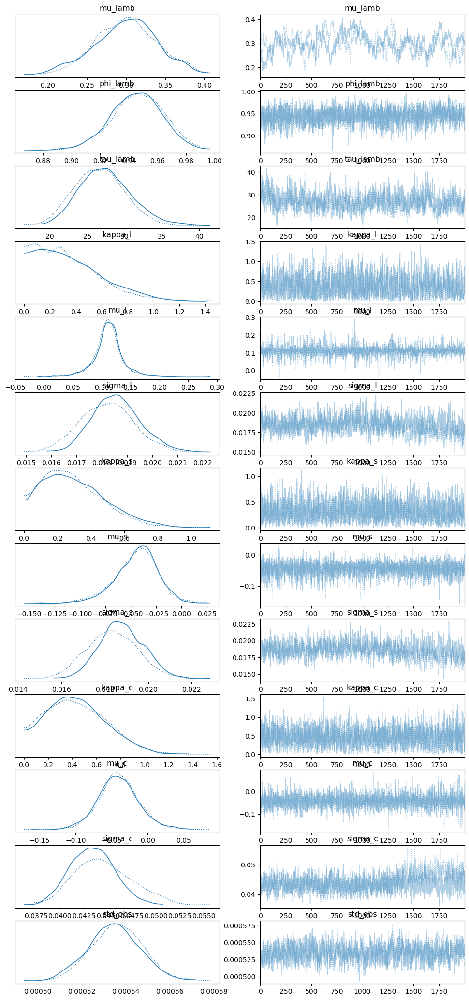

In [102]:
az.plot_trace(dns_dl_br_data, var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'])

array([[<Axes: title={'center': 'mu_lamb\n0'}>,
        <Axes: title={'center': 'mu_lamb\n1'}>,
        <Axes: title={'center': 'phi_lamb\n0'}>,
        <Axes: title={'center': 'phi_lamb\n1'}>],
       [<Axes: title={'center': 'tau_lamb\n0'}>,
        <Axes: title={'center': 'tau_lamb\n1'}>,
        <Axes: title={'center': 'kappa_l\n0'}>,
        <Axes: title={'center': 'kappa_l\n1'}>],
       [<Axes: title={'center': 'mu_l\n0'}>,
        <Axes: title={'center': 'mu_l\n1'}>,
        <Axes: title={'center': 'sigma_l\n0'}>,
        <Axes: title={'center': 'sigma_l\n1'}>],
       [<Axes: title={'center': 'kappa_s\n0'}>,
        <Axes: title={'center': 'kappa_s\n1'}>,
        <Axes: title={'center': 'mu_s\n0'}>,
        <Axes: title={'center': 'mu_s\n1'}>],
       [<Axes: title={'center': 'sigma_s\n0'}>,
        <Axes: title={'center': 'sigma_s\n1'}>,
        <Axes: title={'center': 'kappa_c\n0'}>,
        <Axes: title={'center': 'kappa_c\n1'}>],
       [<Axes: title={'center': 'mu_c\n0'}>

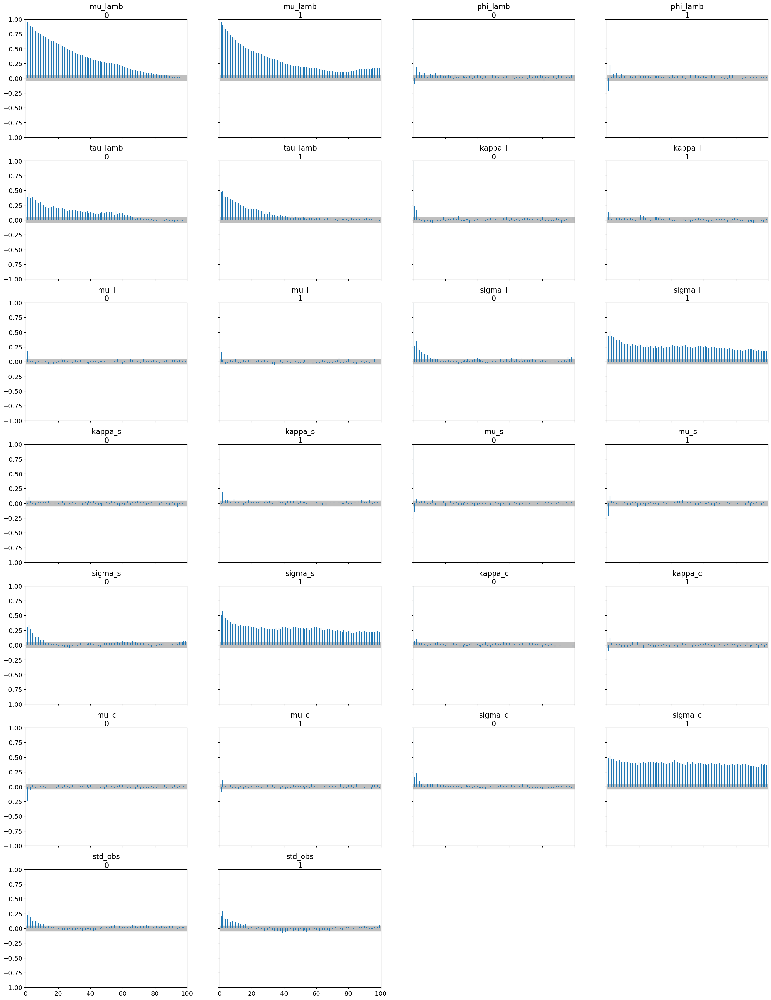

In [103]:
az.plot_autocorr(dns_dl_br_data,var_names=['~level','~slope','~curvature','~lamb_ns','~ln_lamb'])

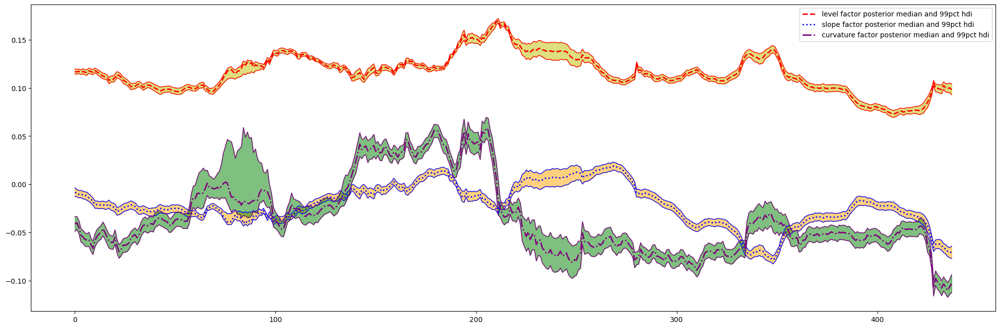

In [104]:
posterior_median_l = np.array(np.median(dns_dl_br_trace.posterior['level'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_l = az.hdi(dns_dl_br_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_l = az.hdi(dns_dl_br_trace.posterior['level'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_s = np.array(np.median(dns_dl_br_trace.posterior['slope'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_s = az.hdi(dns_dl_br_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_s = az.hdi(dns_dl_br_trace.posterior['slope'].to_numpy(),hdi_prob=.99).T[1]
posterior_median_c = np.array(np.median(dns_dl_br_trace.posterior['curvature'].to_numpy(),axis=(0,1)))
posterior_hpd_lower_c = az.hdi(dns_dl_br_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[0]
posterior_hpd_upper_c = az.hdi(dns_dl_br_trace.posterior['curvature'].to_numpy(),hdi_prob=.99).T[1]

plt.figure(figsize=(25,8))
plt.plot(posterior_median_l, 'r', lw=2, label="level factor posterior median and 99pct hdi", linestyle='dashed')
plt.plot(posterior_hpd_upper_l, "r", lw=1)
plt.plot(posterior_hpd_lower_l, "r", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_l, posterior_hpd_upper_l, color="y", alpha=0.5)
plt.plot(posterior_median_s, 'b', lw=2, label="slope factor posterior median and 99pct hdi", linestyle='dotted')
plt.plot(posterior_hpd_upper_s, "b", lw=1)
plt.plot(posterior_hpd_lower_s, "b", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_s, posterior_hpd_upper_s, color="orange", alpha=0.5)
plt.plot(posterior_median_c, 'purple', lw=2, label="curvature factor posterior median and 99pct hdi", linestyle='dashdot')
plt.plot(posterior_hpd_upper_c, "purple", lw=1)
plt.plot(posterior_hpd_lower_c, "purple", lw=1)
plt.fill_between(range(0,T),posterior_hpd_lower_c, posterior_hpd_upper_c, color="g", alpha=0.5)
plt.legend()

<Axes: xlabel='y / y'>

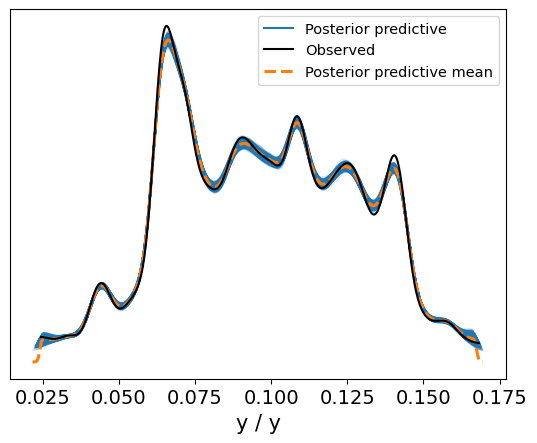

In [105]:
az.plot_ppc(dns_dl_br_ppc)

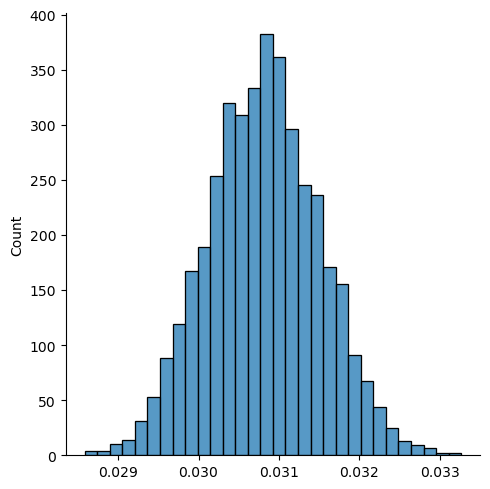

In [106]:
rmse_post_draws_dns = []

for i in range(chains):
    for j in range(draws):
        rmse_post_draws_dns.append(np.sum(np.sqrt((dns_dl_br_ppc.posterior_predictive['y'][i][j].T - spot_br_obs)**2/(len(TTM)*T))))
rmse_post_draws_dns = np.array(rmse_post_draws_dns)
sns.displot(rmse_post_draws_dns, bins=30)

In [131]:
compare_br = az.compare({"Vasicek": vasicek_br_data, "CIR": CIR_br_data,"DL static lambda": dns_sl_br_data,'DL dynamic lambda': dns_dl_br_data}, ic='loo')
compare_br

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
DL dynamic lambda,0,15276.534044,1120.047681,0.000000,9.742377e-01,48.205469,0.000000,True,log
DL static lambda,1,14627.828534,934.158709,648.705510,2.486933e-02,49.591726,40.675407,True,log
Vasicek,2,9711.489765,109.558784,5565.044279,2.040274e-12,43.364647,57.716413,False,log
CIR,3,9707.360771,115.901853,5569.173273,8.929415e-04,43.543059,57.833351,False,log


In [132]:
compare_br.to_latex()

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\2632708054.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  compare_br.to_latex()


'\\begin{tabular}{lrrrrrrrll}\n\\toprule\n{} &  rank &      elpd\\_loo &        p\\_loo &    elpd\\_diff &        weight &         se &        dse &  warning & scale \\\\\n\\midrule\nDL dynamic lambda &     0 &  15276.534044 &  1120.047681 &     0.000000 &  9.742377e-01 &  48.205469 &   0.000000 &     True &   log \\\\\nDL static lambda  &     1 &  14627.828534 &   934.158709 &   648.705510 &  2.486933e-02 &  49.591726 &  40.675407 &     True &   log \\\\\nVasicek           &     2 &   9711.489765 &   109.558784 &  5565.044279 &  2.040274e-12 &  43.364647 &  57.716413 &    False &   log \\\\\nCIR               &     3 &   9707.360771 &   115.901853 &  5569.173273 &  8.929415e-04 &  43.543059 &  57.833351 &    False &   log \\\\\n\\bottomrule\n\\end{tabular}\n'

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

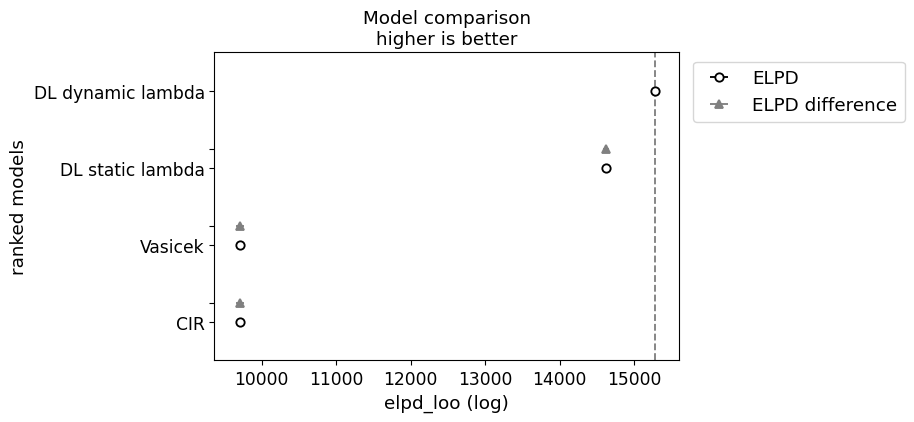

In [136]:
az.plot_compare(compare_br, insample_dev=False)

In [133]:
compare_br_waic = az.compare({"Vasicek": vasicek_br_data, "CIR": CIR_br_data,"DL static lambda": dns_sl_br_data,'DL dynamic lambda': dns_dl_br_data}, ic='waic')
compare_br_waic

C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
C:\Users\USUARIO\anaconda3\envs\pymc_env\lib\site-packages\arviz\stats\stats

,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
DL dynamic lambda,0,15459.485209,937.096517,0.000000,0.999016,44.666097,0.000000,True,log
DL static lambda,1,14743.862374,818.124869,715.622835,0.000000,46.753820,38.011431,True,log
Vasicek,2,9711.914117,109.134433,5747.571092,0.000000,43.356807,55.882504,True,log
CIR,3,9707.853509,115.409115,5751.631699,0.000984,43.532684,56.000727,True,log


In [134]:
compare_br_waic.to_latex()

C:\Users\USUARIO\AppData\Local\Temp\ipykernel_8212\3778333557.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  compare_br_waic.to_latex()


'\\begin{tabular}{lrrrrrrrll}\n\\toprule\n{} &  rank &     elpd\\_waic &      p\\_waic &    elpd\\_diff &    weight &         se &        dse &  warning & scale \\\\\n\\midrule\nDL dynamic lambda &     0 &  15459.485209 &  937.096517 &     0.000000 &  0.999016 &  44.666097 &   0.000000 &     True &   log \\\\\nDL static lambda  &     1 &  14743.862374 &  818.124869 &   715.622835 &  0.000000 &  46.753820 &  38.011431 &     True &   log \\\\\nVasicek           &     2 &   9711.914117 &  109.134433 &  5747.571092 &  0.000000 &  43.356807 &  55.882504 &     True &   log \\\\\nCIR               &     3 &   9707.853509 &  115.409115 &  5751.631699 &  0.000984 &  43.532684 &  56.000727 &     True &   log \\\\\n\\bottomrule\n\\end{tabular}\n'

<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_waic (log)', ylabel='ranked models'>

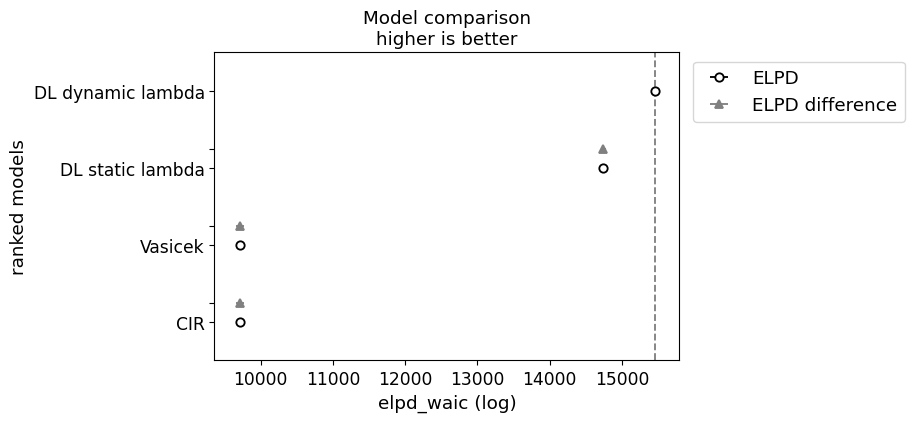

In [135]:
az.plot_compare(compare_br_waic, insample_dev=False)

In [ ]:
osterior_median_level = np.array(np.median(dns_br_trace[l],axis=0).T)
posterior_median_slope = np.array(np.median(dns_br_trace[s],axis=0).T)
posterior_median_curvature = np.array(np.median(dns_br_trace[c],axis=0).T)
lamb_ns = 0.7173

def Y_median(l,s,c,tau):
    return l + s*((1-np.exp(-lamb_ns*tau))/(lamb_ns*tau)) + c*(((1-np.exp(-lamb_ns*tau))/(lamb_ns*tau)) - np.exp(-lamb_ns*tau))

tau_range = np.linspace(0,10,100)
t_range = np.linspace(1,438,438)
t_range, tau_range = np.meshgrid(t_range,tau_range)

ax = plt.axes(projection='3d')
ax.set_xlabel("$X$")
ax.set_ylabel("$Y$")
ax.set_zlabel("$Z$")
ax.plot_surface(t_range, tau_range, Y_median(posterior_median_level.T,posterior_median_slope.T,posterior_median_curvature.T,np.linspace(0.1,10,100)).T,cmap='jet')